<a href="https://colab.research.google.com/github/horsinnaround/Thesis---a-two-layer-power-network/blob/main/thesis_week_6_7.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [226]:
%pip install pandapower
import pandapower as pp
import networkx as nx
import pandapower.networks as pn
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import pandapower.topology as top
# import networkx as nx
from pandapower import plotting
from pandapower.plotting import simple_plot, pf_res_plotly,simple_plotly
import random as rn
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# plt.rcParams['figure.dpi'] = 100
# plt.rcParams['savefig.dpi'] = 100

In [227]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
Net = pn.case118()

# Talks about slacks

In [ ]:
Net = pn.case118()
Net.gen

,name,bus,p_mw,vm_pu,sn_mva,min_q_mvar,max_q_mvar,scaling,slack,in_service,slack_weight,type,controllable,max_p_mw,min_p_mw
0,None,0,0.0,0.955,NaN,-5.0,15.0,1.0,False,True,0.0,None,True,100.0,0.0
1,None,3,0.0,0.998,NaN,-300.0,300.0,1.0,False,True,0.0,None,True,100.0,0.0
2,None,5,0.0,0.990,NaN,-13.0,50.0,1.0,False,True,0.0,None,True,100.0,0.0
3,None,7,0.0,1.015,NaN,-300.0,300.0,1.0,False,True,0.0,None,True,100.0,0.0
4,None,9,450.0,1.050,NaN,-147.0,200.0,1.0,False,True,0.0,None,True,550.0,0.0
5,None,11,85.0,0.990,NaN,-35.0,120.0,1.0,False,True,0.0,None,True,185.0,0.0
6,None,14,0.0,0.970,NaN,-10.0,30.0,1.0,False,True,0.0,None,True,100.0,0.0
7,None,17,0.0,0.973,NaN,-16.0,50.0,1.0,False,True,0.0,None,True,100.0,0.0
8,None,18,0.0,0.962,NaN,-8.0,24.0,1.0,False,True,0.0,None,True,100.0,0.0
9,None,23,0.0,0.992,NaN,-300.0,300.0,1.0,False,True,0.0,None,True,100.0,0.0


In [ ]:
j = 4
Net.gen['p_mw'].iloc[j] *= 1.1
Net.gen

,name,bus,p_mw,vm_pu,sn_mva,min_q_mvar,max_q_mvar,scaling,slack,in_service,slack_weight,type,controllable,max_p_mw,min_p_mw
0,None,0,0.0,0.955,NaN,-5.0,15.0,1.0,False,True,0.0,None,True,100.0,0.0
1,None,3,0.0,0.998,NaN,-300.0,300.0,1.0,False,True,0.0,None,True,100.0,0.0
2,None,5,0.0,0.990,NaN,-13.0,50.0,1.0,False,True,0.0,None,True,100.0,0.0
3,None,7,0.0,1.015,NaN,-300.0,300.0,1.0,False,True,0.0,None,True,100.0,0.0
4,None,9,544.5,1.050,NaN,-147.0,200.0,1.0,False,True,0.0,None,True,550.0,0.0
5,None,11,85.0,0.990,NaN,-35.0,120.0,1.0,False,True,0.0,None,True,185.0,0.0
6,None,14,0.0,0.970,NaN,-10.0,30.0,1.0,False,True,0.0,None,True,100.0,0.0
7,None,17,0.0,0.973,NaN,-16.0,50.0,1.0,False,True,0.0,None,True,100.0,0.0
8,None,18,0.0,0.962,NaN,-8.0,24.0,1.0,False,True,0.0,None,True,100.0,0.0
9,None,23,0.0,0.992,NaN,-300.0,300.0,1.0,False,True,0.0,None,True,100.0,0.0


In [ ]:
# i = 50
# j = 2
# Net.gen['p_mw'].iloc[j] = i
# Net.gen['max_p_mw'].iloc[j] = i * 1.5

# Net.gen['slack'].iloc[j] = True
# # Net.gen['slack_weight'].iloc[2] = 1000


Net.gen

,name,bus,p_mw,vm_pu,sn_mva,min_q_mvar,max_q_mvar,scaling,slack,in_service,slack_weight,type,controllable,max_p_mw,min_p_mw
0,None,1,60.97,1.0,NaN,-20.0,60.0,1.0,False,True,0.0,None,True,80.0,0.0
1,None,21,21.59,1.0,NaN,-15.0,62.5,1.0,False,True,0.0,None,True,50.0,0.0
2,None,26,26.91,1.0,NaN,-15.0,48.7,1.0,False,True,0.0,None,True,55.0,0.0
3,None,22,19.20,1.0,NaN,-10.0,40.0,1.0,False,True,0.0,None,True,30.0,0.0
4,None,12,37.00,1.0,NaN,-15.0,44.7,1.0,True,True,0.0,None,True,40.0,0.0


In [ ]:
# Net.res_line

In [ ]:
for o in range(1,29):
    Net = pn.case30()
    pp.rundcpp(net=Net)
    pp.drop_buses(net = Net,buses = [o] , drop_elements=True)
    pp.rundcpp(net=Net)
    drop_lines = pp.overloaded_lines(Net)
    print(o,drop_lines)
    # pf_res_plotly(Net)

In [ ]:
# 30 -> 29

In [ ]:
print('plot --> table')
for i in range(1,31):
    print(i,'   -->',i-1)

plot --> table
1    --> 0
2    --> 1
3    --> 2
4    --> 3
5    --> 4
6    --> 5
7    --> 6
8    --> 7
9    --> 8
10    --> 9
11    --> 10
12    --> 11
13    --> 12
14    --> 13
15    --> 14
16    --> 15
17    --> 16
18    --> 17
19    --> 18
20    --> 19
21    --> 20
22    --> 21
23    --> 22
24    --> 23
25    --> 24
26    --> 25
27    --> 26
28    --> 27
29    --> 28
30    --> 29


In [ ]:
0,1,2,3,4

In [ ]:
Nett['gen']['slack']

0    False
1    False
2    False
3    False
4    False
Name: slack, dtype: bool

In [ ]:
# o = 5
# j = 4
Net = pn.case30()
# nodes = 30
# Net = create_network1O1(nodes=nodes,k=4,p=0.25)
# Net.gen['slack'].iloc[j] = True
# print(Net.gen['bus'].iloc[j]+1)
# print(Net.gen['p_mw'].iloc[j])
# print(Net.gen['p_mw'].iloc[j])

pp.rundcpp(net=Net)
print(Net['res_line']['loading_percent'].max())
# print(Net.res_gen)
# print(Net.gen['max_p_mw'])
# print(Net.gen['p_mw'].iloc[j])


# pp.drop_buses(net = Net,buses = [o] , drop_elements=True)
for j in range(len(Net.gen['p_mw'])):
    Net.gen['p_mw'].iloc[j] *= 5
pp.rundcpp(net=Net)
drop_lines = pp.overloaded_lines(Net)
# print("[20, 31, 32, 34]")
print(o,drop_lines)
pp.drop_lines(Net,drop_lines)
pp.rundcpp(net=Net)
print(Net['res_line']['loading_percent'].max())

drop_lines = pp.overloaded_lines(Net)
pp.drop_lines(Net,drop_lines)
print(o,drop_lines)
# print(o,drop_lines)
pp.rundcpp(net=Net)
print(Net['res_line']['loading_percent'].max())

drop_lines = pp.overloaded_lines(Net)
pp.drop_lines(Net,drop_lines)
print(o,drop_lines)
pp.rundcpp(net=Net)
print(Net['res_line']['loading_percent'].max())

drop_lines = pp.overloaded_lines(Net)
pp.drop_lines(Net,drop_lines)
print(o,drop_lines)
pp.rundcpp(net=Net)
print(Net['res_line']['loading_percent'].max())

drop_lines = pp.overloaded_lines(Net)
pp.drop_lines(Net,drop_lines)
print(o,drop_lines)
pp.rundcpp(net=Net)
print(Net['res_line']['loading_percent'].max())

drop_lines = pp.overloaded_lines(Net)
pp.drop_lines(Net,drop_lines)
print(o,drop_lines)
# print(Net.res_gen)
print(Net['res_line']['loading_percent'].max())

pf_res_plotly(Net)

77.32993093637548
5 Int64Index([0, 1, 2, 3, 5, 10, 11, 13, 14, 15, 20, 21, 22, 26, 27, 28, 29, 30,
            31, 35, 40],
           dtype='int64')
nan
5 Int64Index([], dtype='int64')
nan
5 Int64Index([], dtype='int64')
nan
5 Int64Index([], dtype='int64')
nan
5 Int64Index([], dtype='int64')
nan
5 Int64Index([], dtype='int64')
nan


/usr/local/lib/python3.10/dist-packages/pandapower/plotting/plotly/pf_res_plotly.py:164: FutureWarning:

The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.



In [ ]:
Net = pn.case118()
pf_res_plotly(Net)

In [ ]:
pp.rundcpp(net=Net)
Net['res_line']['loading_percent'].max()

47.45860092559313

In [ ]:
pf_res_plotly(Net)

In [ ]:
o = 5
j = 2
Net = pn.case30()
Net.gen['slack'].iloc[j] = True
pp.rundcpp(net=Net)
pp.drop_buses(net = Net,buses = [o] , drop_elements=True)
pp.rundcpp(net=Net)
drop_lines = pp.overloaded_lines(Net)
print("[20, 31, 32, 34]")
print(o,drop_lines)
pf_res_plotly(Net)

[20, 31, 32, 34]
5 Int64Index([], dtype='int64')


/usr/local/lib/python3.10/dist-packages/pandapower/plotting/plotly/pf_res_plotly.py:164: FutureWarning:

The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.



# Create a New model

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx

In [ ]:
seed = 1537
alpha = 0.39
beta = 0.1
gamma = 1-(alpha + beta)
alpha,beta,gamma
np.random.seed(seed)


In [ ]:
# G = nx.watts_strogatz_graph(30,k=2,p=0.1,seed=100)

In [ ]:
# drows2(G)

In [ ]:

nodes=101
k=4
# seed=seed
# np.random.seed(seed)

p=0.2
types=0
# G = nx.watts_strogatz_graph(nodes,k,p=p,seed=seed)
# edges = list(G.edges())

In [ ]:
def create_network1O1(nodes=101,k=2,seed=seed,p=0.2,types=0):
    # np.random.seed(0)
    np.random.seed(seed)
    # np.random.rand(seed)


    if types == 1:
        G1 = nx.barabasi_albert_graph(nodes,m=k,seed=seed)
    elif types == 0:
        G1 = nx.watts_strogatz_graph(nodes,k,p=p,seed=seed)
    if k > 3:
        edges = G1.edges()
        # print('edges' , len(edges))
        m = np.array(edges)
        h = len(m[m[:,0]==0])
        # print('h',h)
        nds = G1.nodes()
        po = np.random.randint(int(h/2),len(edges),int(nodes*3.2))
        # print('po',len(po))
        eds = list(np.array(edges)[po])
        eds2 = list(np.array(edges)[0:h])
        eds = eds + eds2
        eds = np.array(eds)
        # print('eds',len(eds))
        G=nx.empty_graph()
        G.add_nodes_from(nds)
        G.add_edges_from(np.array(eds))
        # print(len(G.edges()))
    else:
        G = G1
        # edges= G.edges()

    components_of_groph = sorted(nx.connected_components(G), key=len, reverse=True)
    while len(components_of_groph) != 1:
        multiple = len(components_of_groph)
        # print(f'model has {multiple} clusters so we connected them.')
        # drows2(G)
        # if len(components_of_groph)==2:
        g1 = list(components_of_groph[0])
        g2 = list(components_of_groph[1])
        if len(g2) < 3:
            k1 = 1
        else:
            k1 = k
        grand1 = np.random.randint(0,len(g1),k1)
        grand2 = np.random.randint(0,len(g2),k1)
        # print(grand1,grand2)
        for i,j in zip(grand1,grand2):
            print(g1[i],g2[j])
            G.add_edge(g1[i],g2[j])
        # else:pass
        components_of_groph = sorted(nx.connected_components(G), key=len, reverse=True)
    # drows2(G)


    Nett = pn.case118()

    #create empty net
    net = pp.create_empty_network()

    l =(nodes/Nett['bus'].shape[0]) # relation between our network on 118 network
    #create buses and bus elements
    sigma,mu  = Nett['bus']['vn_kv'].std(),Nett['bus']['vn_kv'].mean()
    # sigma,mu = sigma*l,mu*l
    sigma,mu = sigma*l,mu

    s0 = np.abs(np.random.normal(mu, sigma, nodes))

    sigma,mu  = Nett['load']['p_mw'].std(),Nett['load']['p_mw'].mean()
    # sigma,mu = sigma*l,mu*l
    sigma,mu = sigma*l,mu

    s1 = np.abs(np.random.normal(mu, sigma, nodes))

    # sigma,mu  = Nett['load']['q_mvar'].std(),Nett['load']['q_mvar'].mean()
    # sigma,mu = sigma*l,mu*l
    # sigma,mu = sigma*l,mu
    sigma,mu = 0.2,0.5
    s2 = np.abs(np.random.normal(mu, sigma, nodes))
    s2[s2>0.8] = 0.8
    # s2[s2<0.1] = 0.8

    sigma,mu  = Nett['gen']['p_mw'].std(),Nett['gen']['p_mw'].mean()
    # sigma,mu = sigma*l,mu*l
    sigma,mu = sigma*l,mu

    s3 = np.abs(np.random.normal(mu, sigma,int(30*l)))

    sigma,mu = 0.03,0.97
    s4 = np.abs(np.random.normal(mu, sigma, int(30*l)))

    for i in range(nodes):
        pp.create_bus(net, vn_kv=s0[i], name=f"Bus {i}")
        # if i not in jj:
            # pp.create_load(net, bus=i, p_mw=s1[i], q_mvar=s2[i], name=f"Load {i}")

    pp.create_ext_grid(net, bus=0, vm_pu=1.02, name="Grid Connection")

    jj = set()

    for i in range(int(30*l)):
        j = np.random.randint(nodes)
        if j not in jj and j!=0:
            pp.create_gen(net=net, bus=j, p_mw=s3[i], vm_pu=s4[i],name=f"gen {i}",max_p_mw=1.5*s3[i] ,min_p_mw=0,min_q_mvar=-20*l,max_q_mvar=20*l)
        jj.add(j)
    s4 = np.abs(np.random.normal(mu, sigma, nodes))
    for i in range(1,nodes):
        if i not in jj:
            pp.create_load(net, bus=i, p_mw=s1[i], q_mvar=s2[i]*s1[i], name=f"Load {i}",vm_pu=s4[i])

    edges = list(G.edges())
    for i,j in edges:
        # print(i,j)
        pp.create_line(net, from_bus=i, to_bus=j, length_km=1, name=f"Line {i}-{j}",std_type="NAYY 4x50 SE",)

    net['line']['max_i_ka'] = 7 * l

    pp.rundcpp(net=net)
    m = np.array(net['res_line'][net['res_line']['loading_percent']>80].index)
    # print(net['line']['max_i_ka'][m])
    # net['line']['max_i_ka'][m] *= (net['res_line']['loading_percent'][m]*1.25)/100
    net['line']['max_i_ka'][m] *= (net['res_line']['loading_percent'][m]*2)/100
    pp.rundcpp(net=net)
    # print(net['line']['max_i_ka'][m])
    G_power = top.create_nxgraph(net=net)
    posP = nx.spring_layout(G_power, seed = seed)
    kl = pd.DataFrame().from_dict(posP,orient='index')
    net['bus_geodata']['x'] = kl[0]
    net['bus_geodata']['y'] = kl[1]
    net['bus_geodata']['coords'] = None



    return net

In [ ]:
def create_net(net):
    np.random.seed(seed)

    Net = net
    G_power = top.create_nxgraph(net=Net)
    # extract some feature for future
    G_power_nodes = G_power.nodes()
    G_power_nodes_Number = len(G_power_nodes)
    G_power_edges = G_power.edges()
    target = int(Net.ext_grid['bus'])
    Static_node_of_power = len(Net.bus)
    G_scale_free = nx.scale_free_graph(n= Static_node_of_power, alpha= alpha, beta= beta, gamma= gamma, seed= seed, delta_in=1, delta_out=1 )
        # create Com from Scale free
    # print(set(G_scale_free.nodes()))
    G_com_edges = G_scale_free.edges()
    G_com_edges_set = set(G_com_edges)
    G_com_edges_set_non_redundancy = []
    # print(set(G_com.nodes()))
    for G_edge in G_com_edges_set:
        if (G_edge[1],G_edge[0]) and (G_edge[0],G_edge[1]) not in G_com_edges_set_non_redundancy:
            if G_edge[1] != G_edge[0]:
                G_com_edges_set_non_redundancy.append(G_edge)
    G_com = nx.MultiGraph()
    # print(set(G_com.nodes()))
    G_com.add_edges_from(G_com_edges_set_non_redundancy);
    if len(set(G_scale_free.nodes() - set(G_com.nodes))) > 0:
        for ij in list(set(G_scale_free.nodes() - set(G_com.nodes))):
            G_com.add_edges_from([(ij,np.random.randint(len(G_power.nodes())))])
    # print(set(G_com.nodes()))
        # add a few work to this
    mapping = {0:target,target:0}
    G_com = nx.relabel_nodes(G_com, mapping)

        # extract initial information
    G_com_nodes = G_com.nodes()
    # print(set(G_com.nodes()))
    G_com_edges = G_com.edges()
    # print("Networks settings are Done!")
    return G_com,Net,G_power,target,G_power_nodes_Number

In [ ]:
# G_com,Net,G_power,target,G_power_nodes_Number = create_net()

In [ ]:
def drows():
    np.random.seed(seed)

    posC = nx.spring_layout(G_com, seed = seed)
    posP = nx.spring_layout(G_power, seed = seed)
    plt.figure(figsize = (10,6))
    plt.subplot(211)
    nx.draw(G_com,pos = posC ,with_labels=True)
    plt.subplot(212)
    nx.draw(G_power, pos = posP,with_labels=True)
    plt.show()

In [ ]:
def drows2(G_power):
    np.random.seed(seed)

    posP = nx.spring_layout(G_power, seed = seed)
    plt.figure(figsize = (30,20))
    # plt.subplot(211)
    nx.draw(G_power, pos = posP,with_labels=True)
    plt.show()

In [ ]:
# posP = nx.spring_layout(G_power, seed = seed)
# kl = pd.DataFrame().from_dict(posP,orient='index')
# net2['bus_geodata']['x'] = kl[0]
# net2['bus_geodata']['y'] = kl[1]
# net2['bus_geodata']['coords'] = None


In [ ]:
# pd.DataFrame().from_dict(posP,orient='index')

In [ ]:
def rendom_remove():
    np.random.seed(seed)

    removable_node = int(np.random.random() * G_power_nodes_Number)
    while target == removable_node:
        removable_node = int(np.random.random() * G_power_nodes_Number)
    Choice = np.random.random()
    rm_node = removable_node
    if Choice <0.5:
        print("first choice was Com and it is {}".format(removable_node))
        G_com.remove_node(rm_node)
        pp.drop_buses(net = Net,buses = [rm_node] , drop_elements=True)
        G_power = top.create_nxgraph(net=Net)
    else:
        print("first choice was Pow and it is {}".format(removable_node))
        pp.drop_buses(net = Net,buses = [rm_node] , drop_elements=True)
        G_com.remove_node(rm_node)
        G_power = top.create_nxgraph(net=Net)
    return G_com,Net,G_power

In [ ]:
# G_com,Net,G_power = rendom_remove()

In [ ]:
def Remove_by_purpose(remove=None):
    np.random.seed(seed)

    if remove:
        pp.drop_buses(net = Net,buses = [remove] , drop_elements=True)
        G_com.remove_node(remove)
        G_power = top.create_nxgraph(net=Net)
        return G_com,Net,G_power
    else:
        None

In [ ]:
# G_com,Net,G_power = Remove_by_purpose(remove=3)

In [ ]:
def Largest_component_with_target(G,target_node):
    np.random.seed(seed)

    # check the largest components
    components_of_groph = sorted(nx.connected_components(G), key=len, reverse=True)
    for component in components_of_groph:
        if target_node in component:
            G = G.subgraph(component)
            G = nx.MultiGraph(G)
    return G

In [ ]:
def Casecade_in_pow(Net,nodes):
    np.random.seed(seed)

    Net = Net
    node = nodes
    if len(node) == 0:
        # self.node = instance_nodes - nodes
        busses = []
    elif len(node) == 1:
        busses = node
    else:

        busses = list(node)
    try:
        pp.drop_buses(Net,buses=busses,drop_elements = True)
    except:pass
    pp.rundcpp(Net)
    drop_lines = pp.overloaded_lines(Net)
    while len(drop_lines) !=0:
        # print("3")
        pp.drop_lines(Net,drop_lines)
        drop_lines = pp.overloaded_lines(Net)
        # print("line 135 worked.",self.drop_lines)
    g_inst = top.create_nxgraph(Net)
    g_inst_2 = Largest_component_with_target(g_inst,target)
    set_nodes_2 = set(g_inst) - set(g_inst_2)
    pp.drop_buses(Net,set_nodes_2,drop_elements = True)
    return Net



In [ ]:
def Casecade_in_com(G_com,nodes):
    np.random.seed(seed)

    G_com = G_com
    node = nodes
    if len(node)!=0:
        # nx.is_frozen(G_com)
        G_com.remove_nodes_from(node)
    return G_com

In [ ]:
def net_analysis(G):
    np.random.seed(seed)

    bb = {}
    pathlengths = []
    print("source vertex {target:length, }")
    for v in G.nodes():
        spl = dict(nx.single_source_shortest_path_length(G, v))
        # print(f"{v} {spl} ")
        print(f"{v} {np.mean(list(spl.values()))} ")
        bb[v] = np.mean(list(spl.values()))

        for p in spl:
            pathlengths.append(spl[p])

    # print()
    print(f"average shortest path length {sum(pathlengths) / len(pathlengths)}")

    # histogram of path lengths
    dist = {}
    for p in pathlengths:
        if p in dist:
            dist[p] += 1
        else:
            dist[p] = 1

    # print()
    print("with lenght X we have y path")
    verts = dist.keys()
    for d in sorted(verts):
        print(f"{d} {dist[d]}")

    print(f"radius: {nx.radius(G)}")
    print(f"diameter: {nx.diameter(G)}") #maximum lenght
    print(f"eccentricity: {nx.eccentricity(G)}")
    print(f"center: {nx.center(G)}")
    print(f"periphery: {nx.periphery(G)}") # nodes with max lenght
    print(f"density: {nx.density(G)}")
    return bb

In [ ]:
def net_analysis2(G):
    np.random.seed(seed)

    bb = {}
    pathlengths = []
    # print("source vertex {target:length, }")
    for v in G.nodes():
        spl = dict(nx.single_source_shortest_path_length(G, v))
        # print(f"{v} {spl} ")
        # print(f"{v} {np.mean(list(spl.values()))} ")
        bb[v] = np.mean(list(spl.values()))

        for p in spl:
            pathlengths.append(spl[p])

    return bb

In [ ]:
def gen_gy(net,num1,num2,bb1,bb2,tries,ids):
    np.random.seed(seed)

    a = len(net['gen'])
    b = int(a * abs(num1))
    c = np.random.randint(0,a,(tries,b))
    for i in c[ids]:
        net.gen['p_mw'].iloc[i] *= (1+num2)
        net.gen['max_p_mw'].iloc[i] *= (1+num2)
    name = ''
    for j in c[ids][0:-1]:
        name += f'{j}({bb1[j]},{bb2[j]})-'
    j = c[ids][-1]
    name += f'{j}({bb1[j]},{bb2[j]})'
    # names = c
    return net,name


In [ ]:
def gen_gy_simple(net,num1,num2,tries,ids):
    np.random.seed(seed)

    a = len(net['gen'])
    b = int(a * abs(num1))
    c = np.random.randint(0,a,(tries,b))
    # print(c)
    for i in c[ids]:
        net.gen['p_mw'].iloc[i] *= (1+num2)
        net.gen['max_p_mw'].iloc[i] *= (1+num2)
    name = ''
    for j in c[ids][0:-1]:
        name += f'{j}-'
    j = c[ids][-1]
    name += f'{j}'
    # names = c
    return net,name

In [ ]:
nodes = 118
net = create_network1O1(nodes=nodes,k=4,p=0.44,types=0)

In [ ]:
# simple_plot(net)
# pf_res_plotly(net)
# simple_plotly(net,)

In [ ]:
G_com,Net,G_power,target,G_power_nodes_Number = create_net(net)

In [ ]:
# drows()

In [ ]:
# for i in range(5):
#     try:
#         G_com,Net,G_power = rendom_remove()
#     except:pass

In [ ]:
# G_com,Net,G_power = rendom_remove()
# # drows2(G_power)
# print(net['bus'].shape[0])
# pf_res_plotly(net)

In [ ]:
# net['gen']['p_mw']

In [ ]:
# G_com,Net,G_power = Remove_by_purpose(remove=1)

In [ ]:
rm_nodes = set() - set()
casecading = True
while casecading:
    G_com = Largest_component_with_target(G_com,target)
    G_power = Largest_component_with_target(G_power,target)
    End_minus_One_of_casecade = (len(G_com.nodes()),len(G_power.nodes()))
    set_nodes = set(G_com.nodes() - G_power.nodes())
    if len(set_nodes)==0:
        set_nodes = set(G_power.nodes() - G_com.nodes())
    if len(set_nodes) != 0:
        print("removed node/nodes in this time in casecading",set_nodes)
        Net = Casecade_in_pow(Net, set_nodes)
        G_power = top.create_nxgraph(Net)
        G_com = Casecade_in_com(G_com, set_nodes)
        # print("in line 127 ",self.G_com.nodes)
    End_of_casecade = (len(G_com.nodes()),len(G_power.nodes()))
    if End_minus_One_of_casecade == End_of_casecade:
        casecading = False
    # print(self.casecading)
1 - net['bus'].shape[0]/nodes
# drows2(G_power)
pf_res_plotly(net)

/usr/local/lib/python3.10/dist-packages/pandapower/plotting/plotly/pf_res_plotly.py:164: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  hoverinfo = pd.Series(index=net.trafo.index, data=hoverinfo)


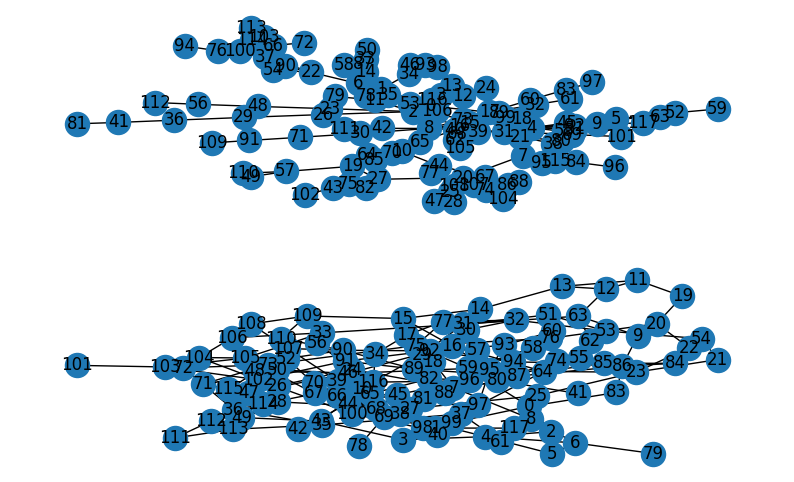

In [ ]:
drows()

In [ ]:
net = create_network1O1(nodes=101,k=4,p=0.44)

In [ ]:
net2 = pp.pandapowerNet(net)
# net2 = pn.case118()
# net2 = pn.case300()
G_com,Net,G_power,target,G_power_nodes_Number = create_net(net2)

G = G_power
net_analysis(G)

In [ ]:
pf_res_plotly(Net)

/usr/local/lib/python3.10/dist-packages/pandapower/plotting/plotly/pf_res_plotly.py:164: FutureWarning:

The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.



In [ ]:
nodes = 300
net = create_network1O1(nodes=nodes,k=4,p=0.44)
# Net = net.copy()


150 60
25 95
42 295


In [ ]:
lj = np.linspace(0.40,0.6,4)

In [ ]:
# plt.figure(figsize==)
nodess = np.random.randint(20,200,10)
nodess

array([181, 185, 149,  27,  57,  22,  77,  36,  37,  85])

In [ ]:
plt.figure(figsize=(12,8))
pi = {}
for nodes in nodess:
    # nodes = 70
    net = create_network1O1(nodes=nodes,k=4,p=0.44)
    gg = {}
    # nodes = 30
    for kk in range(1,nodes):
        # net2 = create_network1O1(nodes=101)
        net2 = pp.pandapowerNet(net)
        # net2 = pn.case118()
        # net2 = pn.case300()
        G_com,Net,G_power,target,G_power_nodes_Number = create_net(net2)
        # G_com,Net,G_power = rendom_remove()
        G_com,Net,G_power = Remove_by_purpose(remove=kk)
        # G_com,Net,G_power = Remove_by_purpose(remove=kk+1)
        rm_nodes = set() - set()
        casecading = True
        while casecading:
            G_com = Largest_component_with_target(G_com,target)
            G_power = Largest_component_with_target(G_power,target)
            End_minus_One_of_casecade = (len(G_com.nodes()),len(G_power.nodes()))
            set_nodes = set(G_com.nodes() - G_power.nodes())
            if len(set_nodes)==0:
                set_nodes = set(G_power.nodes() - G_com.nodes())
            if len(set_nodes) != 0:
                # print("removed node/nodes in this time in casecading",set_nodes)
                Net = Casecade_in_pow(Net, set_nodes)
                G_power = top.create_nxgraph(Net)
                G_com = Casecade_in_com(G_com, set_nodes)
                # print("in line 127 ",self.G_com.nodes)
            End_of_casecade = (len(G_com.nodes()),len(G_power.nodes()))
            if End_minus_One_of_casecade == End_of_casecade:
                casecading = False
            # print(self.casecading)
        # print(f'for removing {kk}: ',1 - net2['bus'].shape[0]/nodes)
        gg[f'{kk}'] = 1 - net2['bus'].shape[0]/nodes
    p = pd.DataFrame.from_dict(gg,orient='index')
    pi[nodes] = list(np.array(p).reshape(-1,))
    plt.plot(p,label=f'{nodes}',alpha=1)
plt.legend()
plt.show()

In [ ]:
nodes = 100

In [ ]:
net3 = create_network1O1(nodes=nodes,k=4,p=0.44)
# net3 = pn.case118()
# nodes = 118

In [ ]:

net = pp.pandapowerNet(net3)
net

This pandapower network includes the following parameter tables:
   - bus (100 element)
   - load (80 element)
   - gen (19 element)
   - ext_grid (1 elements)
   - line (160 element)
   - bus_geodata (100 element)
 and the following results tables:
   - res_bus (100 element)
   - res_line (160 element)
   - res_ext_grid (1 elements)
   - res_load (80 element)
   - res_gen (19 element)

In [ ]:
# nodess = np.random.randint(70,300,10)
# nodess

In [ ]:
# for kk in range(1,nodes):
#     print(kk)

In [ ]:
0.25*.25

0.0625

In [ ]:
def gen_gy(net,num1,num2,bb1,bb2,tries,ids):
    np.random.seed(seed)

    a = len(net['gen'])
    b = int(a * abs(num1))
    c = np.random.randint(0,a,(tries,b))
    for i in c[ids]:
        net.gen['p_mw'].iloc[i] *= (1+num2)
        net.gen['max_p_mw'].iloc[i] *= (1+num2)
    name = ''
    for j in c[ids][0:-1]:
        name += f'{j}({bb1[j]},{bb2[j]})-'
    j = c[ids][-1]
    name += f'{j}({bb1[j]},{bb2[j]})'
    # names = c
    return net,name


In [ ]:
def gen_gy_simple(net,num1,num2,tries,ids):
    np.random.seed(seed)

    a = len(net['gen'])
    b = int(a * abs(num1))
    c = np.random.randint(0,a,(tries,b))
    # print(c)
    for i in c[ids]:
        net.gen['p_mw'].iloc[i] *= (1+num2)
        net.gen['max_p_mw'].iloc[i] *= (1+num2)
    name = ''
    for j in c[ids][0:-1]:
        name += f'{j}-'
    j = c[ids][-1]
    name += f'{j}'
    # names = c
    return net,name

In [ ]:
tries = 4
# np.random.seed(0),np.random.rand(seed)
net = pp.pandapowerNet(net3)
num1 = 0.10
num2 = 0.1

In [ ]:
net = pp.pandapowerNet(net3)
print(net.gen['p_mw'].sum())
# pf_res_plotly(net)
pp.rundcpp(net=net)
net['res_line']['loading_percent'].sum()

19707.23678641756


1300.8371260219765

In [ ]:
ids = 2
tries = 4
# np.random.seed(0),np.random.rand(seed)
net = pp.pandapowerNet(net3)
num1 = 0.95
num2 = -1
np.random.seed(seed)
net,name = gen_gy_simple(net,num1,num2,tries,ids)
print(net.gen['p_mw'].sum())
# net = pp.pandapowerNet(net3)
# pf_res_plotly(net)
pp.rundcpp(net=net)
net['res_line']['loading_percent'].sum()

11111.393511322289


1729.4427274753953

In [ ]:
pf_res_plotly(net)

In [ ]:
nodes = 100
net3 = create_network1O1(nodes=nodes,k=4,p=0.25)
# net3 = pn.case118()
# nodes = 118
net = pp.pandapowerNet(net3)
net

This pandapower network includes the following parameter tables:
   - bus (100 element)
   - load (77 element)
   - gen (22 element)
   - ext_grid (1 elements)
   - line (160 element)
   - bus_geodata (100 element)
 and the following results tables:
   - res_bus (100 element)
   - res_line (160 element)
   - res_ext_grid (1 elements)
   - res_load (77 element)
   - res_gen (22 element)

In [ ]:
# plt.figure(figsize=(12,8))
pi = {}
pi2 = {}
net_base = pp.pandapowerNet(net3)
G_com,Net,G_power,target,G_power_nodes_Number = create_net(net_base)
bb1 = net_analysis2(G_power)
bb2 = net_analysis2(G_com)

# bbsort = sorted(bb.items(), key=lambda x:x[1])
num1 = 1
num2 = 2
tries = 3
for ids in range(tries):
    np.random.seed(0),np.random.rand(seed)
    net = pp.pandapowerNet(net3)
    if ids == 0:
        # gens = 'base'
        name = 'base'
        # pf_res_plotly(net)
        # plt.show()
        print(net.gen['p_mw'].sum())
    elif ids > 0:
        # gens = gens - 1
        # net ,name= gen_gy(net,num1,num2,bb1,bb2,tries,ids)
        net ,name= gen_gy_simple(net,num1,num2,bb1,bb2,tries,ids)

        print(net.gen['p_mw'].sum())

        # pf_res_plotly(net)
        # plt.show()

        # gens = gens-1
        # net.gen['p_mw'].iloc[gens] *= 1.1
        # net.gen['max_p_mw'].iloc[gens] *= 1.1
        # net.gen['p_mw'].iloc[gens+1] *= 1.1
        # net.gen['max_p_mw'].iloc[gens+1] *= 1.1
        # net.gen['p_mw'].iloc[gens+2] *= 1.1
        # net.gen['max_p_mw'].iloc[gens+2] *= 1.1
    # nodes = 100
    # net = create_network1O1(nodes=nodes,k=4,p=0.44)
    # print(name)
    gg = {}
    # nodes = 30
    for kk in range(1,nodes):
        np.random.seed(0),np.random.rand(seed)
        # net = create_network1O1(nodes=101)
        net2 = pp.pandapowerNet(net)
        # net2 = pn.case118()
        # net2 = pn.case300()
        G_com,Net,G_power,target,G_power_nodes_Number = create_net(net2)
        # G_com,Net,G_power = rendom_remove()
        # print(kk)
        G_com,Net,G_power = Remove_by_purpose(remove=kk)
        # G_com,Net,G_power = Remove_by_purpose(remove=kk+1)
        rm_nodes = set() - set()
        casecading = True
        while casecading:
            G_com = Largest_component_with_target(G_com,target)
            G_power = Largest_component_with_target(G_power,target)
            End_minus_One_of_casecade = (len(G_com.nodes()),len(G_power.nodes()))
            set_nodes = set(G_com.nodes() - G_power.nodes())
            if len(set_nodes)==0:
                set_nodes = set(G_power.nodes() - G_com.nodes())
            if len(set_nodes) != 0:
                # print("removed node/nodes in this time in casecading",set_nodes)
                Net = Casecade_in_pow(Net, set_nodes)
                G_power = top.create_nxgraph(Net)
                G_com = Casecade_in_com(G_com, set_nodes)
                # print("in line 127 ",self.G_com.nodes)
            End_of_casecade = (len(G_com.nodes()),len(G_power.nodes()))
            if End_minus_One_of_casecade == End_of_casecade:
                casecading = False
            # print(self.casecading)
        # print(f'for removing {kk} with slacks {name}: ',1 - net2['bus'].shape[0]/nodes)
        # gg[f'{kk}-{bb1[kk]}-{bb2[kk]}'] = 1 - net2['bus'].shape[0]/nodes
        gg[f'{kk}'] = 1 - net2['bus'].shape[0]/nodes

    p = pd.DataFrame.from_dict(gg,orient='index')
    pi[name] = list(np.array(p).reshape(-1,))
    pi2[name] = np.sum(list(np.array(p).reshape(-1,)))

#     plt.plot(p,label=f'{name}',alpha=0.3)
# plt.legend()
# plt.show()

3861.0
28573.0
14357.0


In [ ]:
a = 20
b = 5
ids = 2
tries= 5
c = np.random.randint(0,a,(tries,b))
# print(c)
np.array(list(set(c[ids])))
# for i in c[ids]:

array([ 0,  5,  6, 13, 18])

In [ ]:
# c = np.random.randint(0,1)

In [ ]:
# pi2

In [ ]:
# op

In [ ]:
# opp

In [ ]:
gg = {}
# nodes = 30
for kk in range(1,nodes):
    # net = create_network1O1(nodes=101)
    net2 = pp.pandapowerNet(net)
    # net2 = pn.case118()
    # net2 = pn.case300()
    G_com,Net,G_power,target,G_power_nodes_Number = create_net(net2)
    # G_com,Net,G_power = rendom_remove()
    G_com,Net,G_power = Remove_by_purpose(remove=kk)
    # G_com,Net,G_power = Remove_by_purpose(remove=kk+1)
    rm_nodes = set() - set()
    casecading = True
    while casecading:
        G_com = Largest_component_with_target(G_com,target)
        G_power = Largest_component_with_target(G_power,target)
        End_minus_One_of_casecade = (len(G_com.nodes()),len(G_power.nodes()))
        set_nodes = set(G_com.nodes() - G_power.nodes())
        if len(set_nodes)==0:
            set_nodes = set(G_power.nodes() - G_com.nodes())
        if len(set_nodes) != 0:
            print("removed node/nodes in this time in casecading",set_nodes)
            Net = Casecade_in_pow(Net, set_nodes)
            G_power = top.create_nxgraph(Net)
            G_com = Casecade_in_com(G_com, set_nodes)
            # print("in line 127 ",self.G_com.nodes)
        End_of_casecade = (len(G_com.nodes()),len(G_power.nodes()))
        if End_minus_One_of_casecade == End_of_casecade:
            casecading = False
        # print(self.casecading)
    print(f'for removing {kk}: ',1 - net2['bus'].shape[0]/nodes)
    gg[f'{kk}'] = 1 - net2['bus'].shape[0]/nodes

In [ ]:
p = pd.DataFrame.from_dict(gg,orient='index')
# p

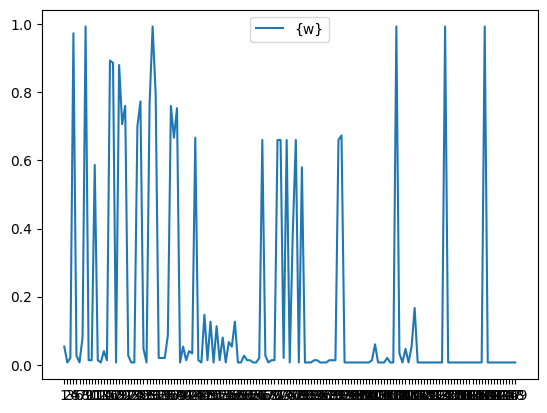

In [ ]:
plt.plot(p,label='{w}')
plt.legend()

<Axes: >

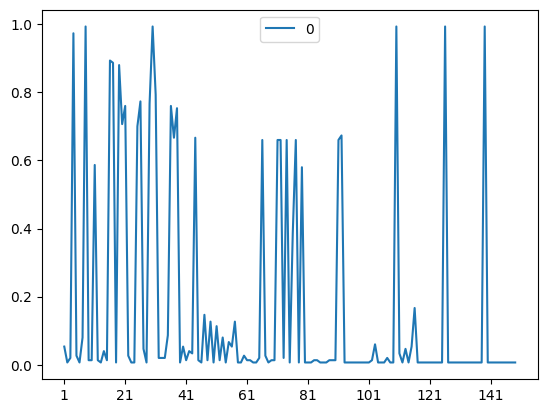

In [ ]:
# p[p>0.03]
p.plot()

<Axes: >

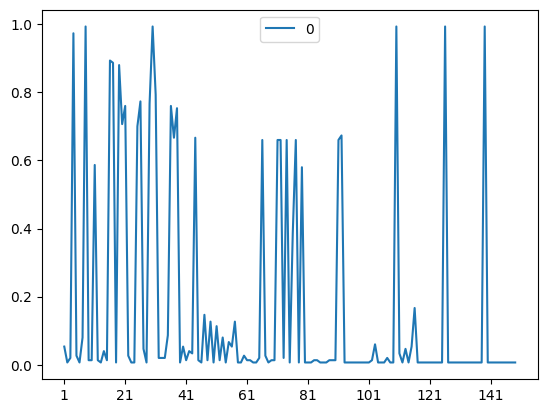

In [ ]:
p.plot()

<Axes: >

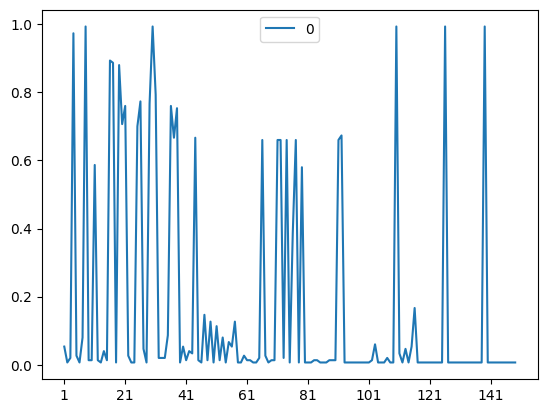

In [ ]:
p.plot()

<Axes: >

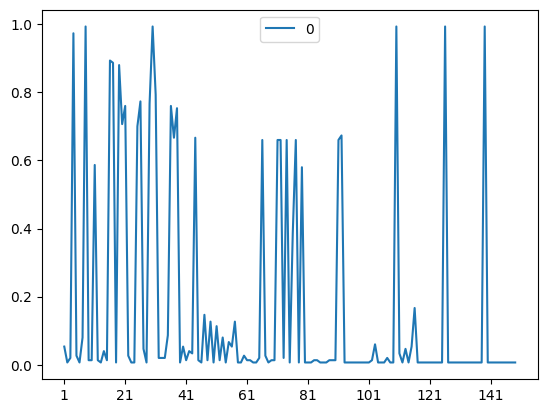

In [ ]:
p.plot()

In [ ]:
set(G_com.nodes()) - set(G_power.nodes())

set()

In [ ]:
set(G_power.nodes()) - set(G_com.nodes())


{49}

In [ ]:
net['bus']

In [ ]:
set(G_com.nodes())-set(G_power.nodes())

set()

# crate model automated

In [228]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx

In [229]:
seed = 1537
alpha = 0.39
beta = 0.1
gamma = 1-(alpha + beta)
alpha,beta,gamma
np.random.seed(seed)


In [230]:

nodes=101
k=4
# seed=seed
# np.random.seed(seed)

p=0.2
types=0
# G = nx.watts_strogatz_graph(nodes,k,p=p,seed=seed)
# edges = list(G.edges())

In [231]:
def create_network1O1(nodes=101,k=2,seed=seed,p=0.2,types=0):
    # np.random.seed(0)
    np.random.seed(seed)
    # np.random.rand(seed)


    if types == 1:
        G1 = nx.barabasi_albert_graph(nodes,m=k,seed=seed)
    elif types == 0:
        G1 = nx.watts_strogatz_graph(nodes,k,p=p,seed=seed)
    if k > 3:
        edges = G1.edges()
        # print('edges' , len(edges))
        m = np.array(edges)
        h = len(m[m[:,0]==0])
        # print('h',h)
        nds = G1.nodes()
        po = np.random.randint(int(h/2),len(edges),int(nodes*3.2))
        # print('po',len(po))
        eds = list(np.array(edges)[po])
        eds2 = list(np.array(edges)[0:int(h/2)])
        eds = eds + eds2
        eds = np.array(eds)
        # print('eds',len(eds))
        G=nx.empty_graph()
        G.add_nodes_from(nds)
        G.add_edges_from(np.array(eds))
        # print(len(G.edges()))
    else:
        G = G1
        # edges= G.edges()

    components_of_groph = sorted(nx.connected_components(G), key=len, reverse=True)
    while len(components_of_groph) != 1:
        multiple = len(components_of_groph)
        # print(f'model has {multiple} clusters so we connected them.')
        # drows2(G)
        # if len(components_of_groph)==2:
        g1 = list(components_of_groph[0])
        g2 = list(components_of_groph[1])
        if len(g2) < 3:
            k1 = 1
        else:
            k1 = k
        grand1 = np.random.randint(0,len(g1),k1)
        grand2 = np.random.randint(0,len(g2),k1)
        # print(grand1,grand2)
        for i,j in zip(grand1,grand2):
            print(g1[i],g2[j])
            G.add_edge(g1[i],g2[j])
        # else:pass
        components_of_groph = sorted(nx.connected_components(G), key=len, reverse=True)
    # drows2(G)


    Nett = pn.case118()

    #create empty net
    net = pp.create_empty_network()

    l =(nodes/Nett['bus'].shape[0]) # relation between our network on 118 network
    #create buses and bus elements
    sigma,mu  = Nett['bus']['vn_kv'].std(),Nett['bus']['vn_kv'].mean()
    # sigma,mu = sigma*l,mu*l
    sigma,mu = sigma*l,mu

    s0 = np.abs(np.random.normal(mu, sigma, nodes))

    sigma,mu  = Nett['load']['p_mw'].std(),Nett['load']['p_mw'].mean()
    # sigma,mu = sigma*l,mu*l
    sigma,mu = sigma*l,mu

    s1 = np.abs(np.random.normal(mu, sigma, nodes))

    # sigma,mu  = Nett['load']['q_mvar'].std(),Nett['load']['q_mvar'].mean()
    # sigma,mu = sigma*l,mu*l
    # sigma,mu = sigma*l,mu
    sigma,mu = 0.2,0.5
    s2 = np.abs(np.random.normal(mu, sigma, nodes))
    s2[s2>0.8] = 0.8
    # s2[s2<0.1] = 0.8

    sigma,mu  = Nett['gen']['p_mw'].std(),Nett['gen']['p_mw'].mean()
    # sigma,mu = sigma*l,mu*l
    sigma,mu = sigma*l,mu

    s3 = np.abs(np.random.normal(mu, sigma,int(30*l)))

    sigma,mu = 0.03,0.97
    s4 = np.abs(np.random.normal(mu, sigma, int(30*l)))

    for i in range(nodes):
        pp.create_bus(net, vn_kv=s0[i], name=f"Bus {i}")
        # if i not in jj:
            # pp.create_load(net, bus=i, p_mw=s1[i], q_mvar=s2[i], name=f"Load {i}")

    pp.create_ext_grid(net, bus=0, vm_pu=1.02, name="Grid Connection")

    jj = set()

    for i in range(int(30*l)):
        j = np.random.randint(nodes)
        if j not in jj and j!=0:
            pp.create_gen(net=net, bus=j, p_mw=s3[i], vm_pu=s4[i],name=f"gen {i}",max_p_mw=1.5*s3[i] ,min_p_mw=0,min_q_mvar=-20*l,max_q_mvar=20*l)
        jj.add(j)
    s4 = np.abs(np.random.normal(mu, sigma, nodes))
    for i in range(1,nodes):
        if i not in jj:
            pp.create_load(net, bus=i, p_mw=s1[i], q_mvar=s2[i]*s1[i], name=f"Load {i}",vm_pu=s4[i])

    edges = list(G.edges())
    for i,j in edges:
        # print(i,j)
        pp.create_line(net, from_bus=i, to_bus=j, length_km=1, name=f"Line {i}-{j}",std_type="NAYY 4x50 SE",)

    net['line']['max_i_ka'] = 7 * l

    pp.rundcpp(net=net)
    m = np.array(net['res_line'][net['res_line']['loading_percent']>80].index)
    # print(net['line']['max_i_ka'][m])
    # net['line']['max_i_ka'][m] *= (net['res_line']['loading_percent'][m]*1.25)/100
    net['line']['max_i_ka'][m] *= (net['res_line']['loading_percent'][m]*2)/100
    pp.rundcpp(net=net)
    # print(net['line']['max_i_ka'][m])
    G_power = top.create_nxgraph(net=net)
    posP = nx.spring_layout(G_power, seed = seed)
    kl = pd.DataFrame().from_dict(posP,orient='index')
    net['bus_geodata']['x'] = kl[0]
    net['bus_geodata']['y'] = kl[1]
    net['bus_geodata']['coords'] = None



    return net

In [232]:
def create_net(net):
    np.random.seed(seed)

    Net = net
    G_power = top.create_nxgraph(net=Net)
    # extract some feature for future
    G_power_nodes = G_power.nodes()
    G_power_nodes_Number = len(G_power_nodes)
    G_power_edges = G_power.edges()
    target = int(Net.ext_grid['bus'])
    Static_node_of_power = len(Net.bus)
    G_scale_free = nx.scale_free_graph(n= Static_node_of_power, alpha= alpha, beta= beta, gamma= gamma, seed= seed, delta_in=1, delta_out=1 )
        # create Com from Scale free
    # print(set(G_scale_free.nodes()))
    G_com_edges = G_scale_free.edges()
    G_com_edges_set = set(G_com_edges)
    G_com_edges_set_non_redundancy = []
    # print(set(G_com.nodes()))
    for G_edge in G_com_edges_set:
        if (G_edge[1],G_edge[0]) and (G_edge[0],G_edge[1]) not in G_com_edges_set_non_redundancy:
            if G_edge[1] != G_edge[0]:
                G_com_edges_set_non_redundancy.append(G_edge)
    G_com = nx.MultiGraph()
    # print(set(G_com.nodes()))
    G_com.add_edges_from(G_com_edges_set_non_redundancy);
    if len(set(G_scale_free.nodes() - set(G_com.nodes))) > 0:
        for ij in list(set(G_scale_free.nodes() - set(G_com.nodes))):
            G_com.add_edges_from([(ij,np.random.randint(len(G_power.nodes())))])
    # print(set(G_com.nodes()))
        # add a few work to this
    mapping = {0:target,target:0}
    G_com = nx.relabel_nodes(G_com, mapping)

        # extract initial information
    G_com_nodes = G_com.nodes()
    # print(set(G_com.nodes()))
    G_com_edges = G_com.edges()
    # print("Networks settings are Done!")
    return G_com,Net,G_power,target,G_power_nodes_Number

In [233]:
def drows():
    np.random.seed(seed)

    posC = nx.spring_layout(G_com, seed = seed)
    posP = nx.spring_layout(G_power, seed = seed)
    plt.figure(figsize = (10,6))
    plt.subplot(211)
    nx.draw(G_com,pos = posC ,with_labels=True)
    plt.subplot(212)
    nx.draw(G_power, pos = posP,with_labels=True)
    plt.show()

In [234]:
def drows2(G_power):
    np.random.seed(seed)

    posP = nx.spring_layout(G_power, seed = seed)
    plt.figure(figsize = (30,20))
    # plt.subplot(211)
    nx.draw(G_power, pos = posP,with_labels=True)
    plt.show()

In [235]:
def rendom_remove():
    np.random.seed(seed)

    removable_node = int(np.random.random() * G_power_nodes_Number)
    while target == removable_node:
        removable_node = int(np.random.random() * G_power_nodes_Number)
    Choice = np.random.random()
    rm_node = removable_node
    if Choice <0.5:
        print("first choice was Com and it is {}".format(removable_node))
        G_com.remove_node(rm_node)
        pp.drop_buses(net = Net,buses = [rm_node] , drop_elements=True)
        G_power = top.create_nxgraph(net=Net)
    else:
        print("first choice was Pow and it is {}".format(removable_node))
        pp.drop_buses(net = Net,buses = [rm_node] , drop_elements=True)
        G_com.remove_node(rm_node)
        G_power = top.create_nxgraph(net=Net)
    return G_com,Net,G_power

In [236]:
def Remove_by_purpose(remove=None):
    np.random.seed(seed)

    if remove:
        pp.drop_buses(net = Net,buses = [remove] , drop_elements=True)
        G_com.remove_node(remove)
        G_power = top.create_nxgraph(net=Net)
        return G_com,Net,G_power
    else:
        None

In [237]:
def Largest_component_with_target(G,target_node):
    np.random.seed(seed)

    # check the largest components
    components_of_groph = sorted(nx.connected_components(G), key=len, reverse=True)
    for component in components_of_groph:
        if target_node in component:
            G = G.subgraph(component)
            G = nx.MultiGraph(G)
    return G

In [238]:
def Casecade_in_pow(Net,nodes):
    np.random.seed(seed)

    Net = Net
    node = nodes
    if len(node) == 0:
        # self.node = instance_nodes - nodes
        busses = []
    elif len(node) == 1:
        busses = node
    else:

        busses = list(node)
    try:
        pp.drop_buses(Net,buses=busses,drop_elements = True)
    except:pass
    pp.rundcpp(Net)
    drop_lines = pp.overloaded_lines(Net)
    while len(drop_lines) !=0:
        # print("3")
        pp.drop_lines(Net,drop_lines)
        drop_lines = pp.overloaded_lines(Net)
        # print("line 135 worked.",self.drop_lines)
    g_inst = top.create_nxgraph(Net)
    g_inst_2 = Largest_component_with_target(g_inst,target)
    set_nodes_2 = set(g_inst) - set(g_inst_2)
    pp.drop_buses(Net,set_nodes_2,drop_elements = True)
    return Net



In [239]:
def Casecade_in_com(G_com,nodes):
    np.random.seed(seed)

    G_com = G_com
    node = nodes
    if len(node)!=0:
        # nx.is_frozen(G_com)
        G_com.remove_nodes_from(node)
    return G_com

In [240]:
def net_analysis(G):
    np.random.seed(seed)

    bb = {}
    pathlengths = []
    print("source vertex {target:length, }")
    for v in G.nodes():
        spl = dict(nx.single_source_shortest_path_length(G, v))
        # print(f"{v} {spl} ")
        print(f"{v} {np.mean(list(spl.values()))} ")
        bb[v] = np.mean(list(spl.values()))

        for p in spl:
            pathlengths.append(spl[p])

    # print()
    print(f"average shortest path length {sum(pathlengths) / len(pathlengths)}")

    # histogram of path lengths
    dist = {}
    for p in pathlengths:
        if p in dist:
            dist[p] += 1
        else:
            dist[p] = 1

    # print()
    print("with lenght X we have y path")
    verts = dist.keys()
    for d in sorted(verts):
        print(f"{d} {dist[d]}")

    print(f"radius: {nx.radius(G)}")
    print(f"diameter: {nx.diameter(G)}") #maximum lenght
    print(f"eccentricity: {nx.eccentricity(G)}")
    print(f"center: {nx.center(G)}")
    print(f"periphery: {nx.periphery(G)}") # nodes with max lenght
    print(f"density: {nx.density(G)}")
    return bb

In [241]:
def net_analysis2(G):
    np.random.seed(seed)

    bb = {}
    pathlengths = []
    # print("source vertex {target:length, }")
    for v in G.nodes():
        spl = dict(nx.single_source_shortest_path_length(G, v))
        # print(f"{v} {spl} ")
        # print(f"{v} {np.mean(list(spl.values()))} ")
        bb[v] = np.mean(list(spl.values()))

        for p in spl:
            pathlengths.append(spl[p])

    return bb

In [242]:
def gen_gy(net,num1,num2,bb1,bb2,tries,ids):
    np.random.seed(seed)

    a = len(net['gen'])
    b = int(a * abs(num1))
    c = np.random.randint(0,a,(tries,b))
    for i in c[ids]:
        net.gen['p_mw'].iloc[i] *= (1+num2)
        net.gen['max_p_mw'].iloc[i] *= (1+num2)
    name = ''
    for j in c[ids][0:-1]:
        name += f'{j}({bb1[j]},{bb2[j]})-'
    j = c[ids][-1]
    name += f'{j}({bb1[j]},{bb2[j]})'
    # names = c
    return net,name


In [243]:
def gen_gy_simple(net,num1,num2,tries,ids):
    np.random.seed(seed)

    a = len(net['gen'])
    b = int(a * abs(num1))
    c = np.random.randint(0,a,(tries,b))
    # print(c)
    for i in c[ids]:
        net.gen['p_mw'].iloc[i] *= (1+num2)
        net.gen['max_p_mw'].iloc[i] *= (1+num2)
    name = ''
    for j in c[ids][0:-1]:
        name += f'{j}-'
    j = c[ids][-1]
    name += f'{j}'
    # names = c
    return net,name

In [244]:
def gen_gy(net,num1,num2,bb1,bb2,tries,ids):
    np.random.seed(seed)

    a = len(net['gen'])
    b = int(a * abs(num1))
    c = np.random.randint(0,a,(tries,b))
    for i in c[ids]:
        net.gen['p_mw'].iloc[i] *= (1+num2)
        net.gen['max_p_mw'].iloc[i] *= (1+num2)
    name = ''
    for j in c[ids][0:-1]:
        name += f'{j}({bb1[j]},{bb2[j]})-'
    j = c[ids][-1]
    name += f'{j}({bb1[j]},{bb2[j]})'
    # names = c
    return net,name


In [245]:
def gen_gy_simple(net,num1,num2,tries,ids):
    np.random.seed(seed)

    a = len(net['gen'])
    b = int(a * abs(num1))
    c = np.random.randint(0,a,(tries,b))
    # print(c)
    for i in c[ids]:
        net.gen['p_mw'].iloc[i] *= (1+num2)
        net.gen['max_p_mw'].iloc[i] *= (1+num2)
    name = ''
    for j in c[ids][0:-1]:
        name += f'{j}-'
    j = c[ids][-1]
    name += f'{j}'
    # names = c
    return net,name

# working with nx

In [ ]:
np.random.randint(100)

79

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx

In [ ]:
# G = nx.watts_strogatz_graph(100,3,p=0.1)

In [ ]:
# G = nx.barabasi_albert_graph(30,2)

In [ ]:
# pos = nx.spring_layout(G, seed = seed)
# plt.figure(figsize = (10,6))
# nx.draw(G, pos = pos,with_labels=True)
# plt.show()

In [ ]:
Net = net.copy()

In [ ]:
import pandapower as pp

In [ ]:
def create_network1O1(nodes=101):
    # G = nx.barabasi_albert_graph(nodes,2)
    G = nx.watts_strogatz_graph(nodes,4,p=0.2)
    Nett = pn.case118()

    #create empty net
    net = pp.create_empty_network()

    l =(nodes/Nett['bus'].shape[0]) # relation between our network on 118 network
    #create buses and bus elements
    sigma,mu  = Nett['bus']['vn_kv'].std(),Nett['bus']['vn_kv'].mean()
    sigma,mu = sigma*l,mu*l
    s0 = np.abs(np.random.normal(mu, sigma, nodes))

    sigma,mu  = Nett['load']['p_mw'].std(),Nett['load']['p_mw'].mean()
    sigma,mu = sigma*l,mu*l
    s1 = np.abs(np.random.normal(mu, sigma, nodes))

    sigma,mu  = Nett['load']['q_mvar'].std(),Nett['load']['q_mvar'].mean()
    sigma,mu = sigma*l,mu*l
    s2 = np.abs(np.random.normal(mu, sigma, nodes))

    sigma,mu  = Nett['gen']['p_mw'].std(),Nett['gen']['p_mw'].mean()
    sigma,mu = sigma*l,mu*l
    s3 = np.abs(np.random.normal(mu, sigma,int(30*l)))

    for i in range(nodes):
        pp.create_bus(net, vn_kv=s0[i], name=f"Bus {i}")
        pp.create_load(net, bus=i, p_mw=s1[i], q_mvar=s2[i], name=f"Load {i}")

    pp.create_ext_grid(net, bus=0, vm_pu=1.02, name="Grid Connection")

    edges = list(G.edges())
    for i,j in edges:
        # print(i,j)
        pp.create_line(net, from_bus=i, to_bus=j, length_km=1, name=f"Line {i}-{j}",std_type="NAYY 4x50 SE",)
    jj = set()

    for i in range(int(30*l)):
        j = np.random.randint(nodes)
        if j not in jj and j!=0:
            pp.create_gen(net=net, bus=j, p_mw=s3[i], vm_pu=1.0,name=f"gen {i}",max_p_mw=1.5*s3[i] ,min_p_mw=0,min_q_mvar=-20*l,max_q_mvar=20*l)
        jj.add(j)
    net['line']['max_i_ka'] = 30 * l

    pp.rundcpp(net=net)
    m = np.array(net['res_line'][net['res_line']['loading_percent']>80].index)
    print(net['line']['max_i_ka'][m])
    net['line']['max_i_ka'][m] *= (net['res_line']['loading_percent'][m]*1.25)/100
    print(net['line']['max_i_ka'][m])
    return net

# resume

In [ ]:
nodes = 200
k = 2
G = nx.watts_strogatz_graph(nodes,k,p=0.2)

In [ ]:
components_of_groph = sorted(nx.connected_components(G), key=len, reverse=True)
len(components_of_groph)

2

In [ ]:
# G.add_edge(i,j)

In [ ]:
while len(components_of_groph) != 1:
    # if len(components_of_groph)==2:
    g1 = list(components_of_groph[0])
    g2 = list(components_of_groph[1])
    grand1 = np.random.randint(0,len(g1),k)
    grand2 = np.random.randint(0,len(g2),k)
    for i,j in zip(grand1,grand2):
        print(i,j)
        G.add_edge(i,j)
    # else:pass
    components_of_groph = sorted(nx.connected_components(G), key=len, reverse=True)

50 36
11 96


In [ ]:
np.random.randint(0,10,3)

array([5, 5, 6])

In [ ]:
list(components_of_groph[1])

12

In [ ]:
for i in components_of_groph[1]:


In [ ]:
def create_network1O1(nodes=101,k=2):
    # G = nx.barabasi_albert_graph(nodes,k)
    G = nx.watts_strogatz_graph(nodes,k,p=0.2)
    components_of_groph = sorted(nx.connected_components(G), key=len, reverse=True)
    while len(components_of_groph) != 1:
        multiple = len(components_of_groph)
        # print(f'model has {multiple} clusters so we connected them.')
        drows(G)
        # if len(components_of_groph)==2:
        g1 = list(components_of_groph[0])
        g2 = list(components_of_groph[1])
        grand1 = np.random.randint(0,len(g1),k)
        grand2 = np.random.randint(0,len(g2),k)
        # print(grand1,grand2)
        for i,j in zip(grand1,grand2):
            print(g1[i],g2[j])
            G.add_edge(g1[i],g2[j])
        # else:pass
        components_of_groph = sorted(nx.connected_components(G), key=len, reverse=True)
    drows(G)


    Nett = pn.case118()

    #create empty net
    net = pp.create_empty_network()

    l =(nodes/Nett['bus'].shape[0]) # relation between our network on 118 network
    #create buses and bus elements
    sigma,mu  = Nett['bus']['vn_kv'].std(),Nett['bus']['vn_kv'].mean()
    sigma,mu = sigma*l,mu*l
    s0 = np.abs(np.random.normal(mu, sigma, nodes))

    sigma,mu  = Nett['load']['p_mw'].std(),Nett['load']['p_mw'].mean()
    sigma,mu = sigma*l,mu*l
    s1 = np.abs(np.random.normal(mu, sigma, nodes))

    sigma,mu  = Nett['load']['q_mvar'].std(),Nett['load']['q_mvar'].mean()
    sigma,mu = sigma*l,mu*l
    s2 = np.abs(np.random.normal(mu, sigma, nodes))

    sigma,mu  = Nett['gen']['p_mw'].std(),Nett['gen']['p_mw'].mean()
    sigma,mu = sigma*l,mu*l
    s3 = np.abs(np.random.normal(mu, sigma,int(30*l)))


    for i in range(nodes):
        pp.create_bus(net, vn_kv=s0[i], name=f"Bus {i}")
        # if i not in jj:
            # pp.create_load(net, bus=i, p_mw=s1[i], q_mvar=s2[i], name=f"Load {i}")

    pp.create_ext_grid(net, bus=0, vm_pu=1.02, name="Grid Connection")

    jj = set()

    for i in range(int(30*l)):
        j = np.random.randint(nodes)
        if j not in jj and j!=0:
            pp.create_gen(net=net, bus=j, p_mw=s3[i], vm_pu=1.0,name=f"gen {i}",max_p_mw=1.5*s3[i] ,min_p_mw=0,min_q_mvar=-20*l,max_q_mvar=20*l)
        jj.add(j)
    for i in range(1,nodes):
        if i not in jj:
            pp.create_load(net, bus=i, p_mw=s1[i], q_mvar=s2[i], name=f"Load {i}")

    edges = list(G.edges())
    for i,j in edges:
        # print(i,j)
        pp.create_line(net, from_bus=i, to_bus=j, length_km=1, name=f"Line {i}-{j}",std_type="NAYY 4x50 SE",)

    net['line']['max_i_ka'] = 30 * l

    pp.rundcpp(net=net)
    m = np.array(net['res_line'][net['res_line']['loading_percent']>80].index)
    # print(net['line']['max_i_ka'][m])
    net['line']['max_i_ka'][m] *= (net['res_line']['loading_percent'][m]*1.25)/100
    # print(net['line']['max_i_ka'][m])
    return net

In [ ]:

Net = pn.case_illinois200()

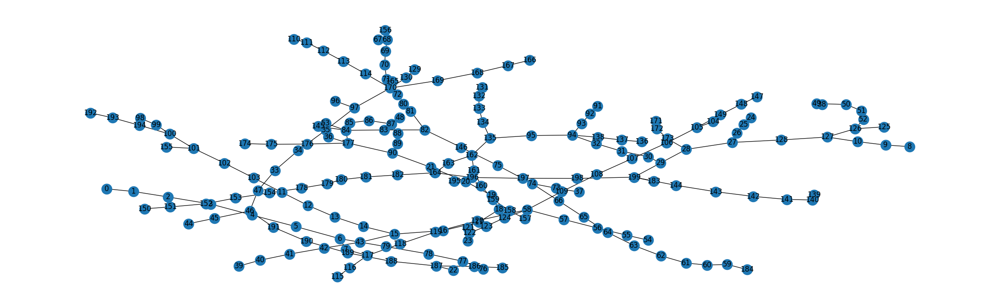

60 153
86 140
43 135


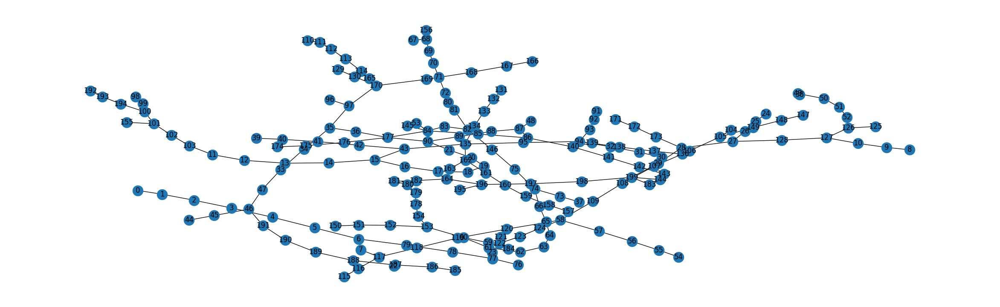

69 23
94 54
18 56


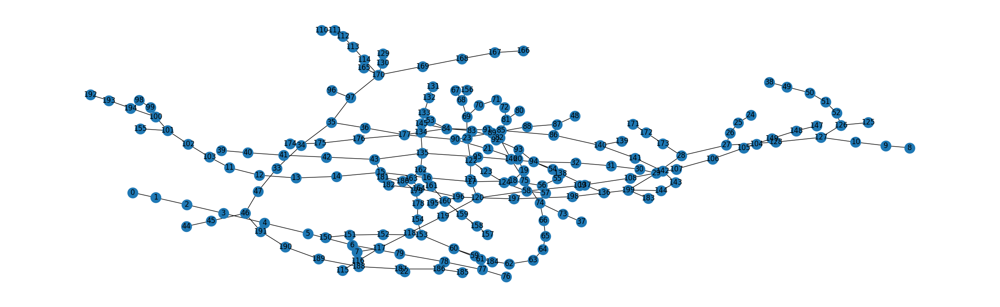

0

In [ ]:
Net = create_network1O1(200,k=3)
np.sum(Net['res_line']['i_ka'].isna())

In [ ]:
# pp.rundcpp(net=Net)
Net

This pandapower network includes the following parameter tables:
   - bus (200 element)
   - load (153 element)
   - gen (46 element)
   - ext_grid (1 elements)
   - line (206 element)
 and the following results tables:
   - res_bus (200 element)
   - res_line (206 element)
   - res_ext_grid (1 elements)
   - res_load (153 element)
   - res_gen (46 element)

In [ ]:
np.sum(Net['res_line']['i_ka'].isna())

0

<Axes: >

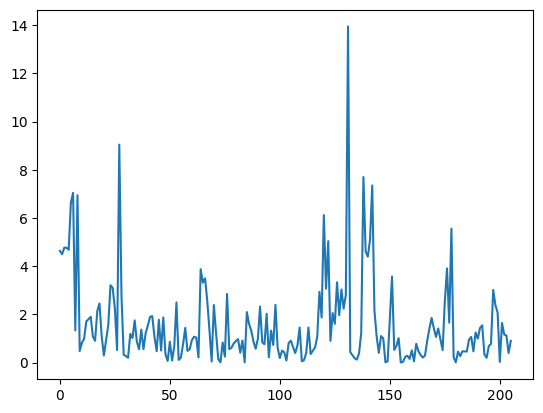

In [ ]:
Net['res_line']['i_ka'].plot()

In [ ]:
Net['line']

In [ ]:
G_power = top.create_nxgraph(net=Net)
def drows(G_power):
    seed = 100
    # posC = nx.spring_layout(G_com, seed = seed)
    posP = nx.spring_layout(G_power, seed = seed)
    plt.figure(figsize = (30,20))
    plt.subplot(211)
    # nx.draw(G_com,pos = posC ,with_labels=True)
    # plt.subplot(212)
    nx.draw(G_power, pos = posP,with_labels=True)
    plt.show()

In [ ]:
Net['gen']

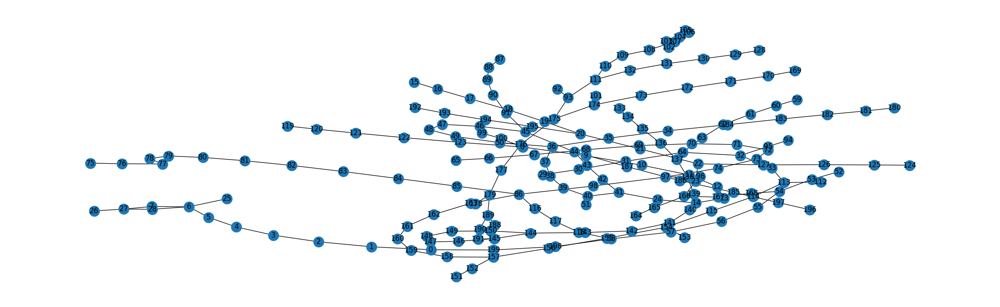

In [ ]:
drows(G)

In [ ]:
l = Net['gen']
l2 = Net['bus']
l3 = Net['load']

In [ ]:
# f = pd.DataFrame()

In [ ]:
f['200'] = [200,l3['p_mw'].sum(),l3['p_mw'].mean(),l3['p_mw'].std(),l3['q_mvar'].sum(),l3['q_mvar'].mean(),l3['q_mvar'].std(),l2['vn_kv'].sum(),l2['vn_kv'].mean(),l2['vn_kv'].std(),l['p_mw'].sum(),l['p_mw'].mean(),l['p_mw'].std(),l['max_p_mw'].sum(),l['max_p_mw'].mean(),l['max_p_mw'].std(),l['min_q_mvar'].sum(),l['min_q_mvar'].mean(),l['min_q_mvar'].std(),l['max_q_mvar'].sum(),l['max_q_mvar'].mean(),l['max_q_mvar'].std(),l['p_mw'].shape[0],l[l['p_mw']>0].shape[0]]

In [ ]:
f.index = ['size','load pmw sum','load pmw mean','load pmw std','load qmvar sum','load qmvar mean','load qmvar std','bus vnkv sum','bus vnkv mean','bus vnkv std','gen pmw sum','gen pmw mean','gen pmw std','gen maxpmw sum','gen maxpmw mean','gen maxpmw std','gen min qmvar sum','gen min qmvar mean','gen min qmvar std','gen max qmvar sum','gen max qmvar mean','gen max qmvar std','gen mpw number','gen mpw not zero number']

In [ ]:
# ff = f.T
ff.columns

Index(['size', 'load pmw sum', 'load pmw mean', 'load pmw std',
       'load qmvar sum', 'load qmvar mean', 'load qmvar std', 'bus vnkv sum',
       'bus vnkv mean', 'bus vnkv std', 'gen pmw sum', 'gen pmw mean',
       'gen pmw std', 'gen maxpmw sum', 'gen maxpmw mean', 'gen maxpmw std',
       'gen min qmvar sum', 'gen min qmvar mean', 'gen min qmvar std',
       'gen max qmvar sum', 'gen max qmvar mean', 'gen max qmvar std',
       'gen mpw number', 'gen mpw not zero number'],
      dtype='object')

In [ ]:
ff = ff.sort_values(by='size')

In [ ]:
ff.index = [i for i in range(ff.shape[0])]

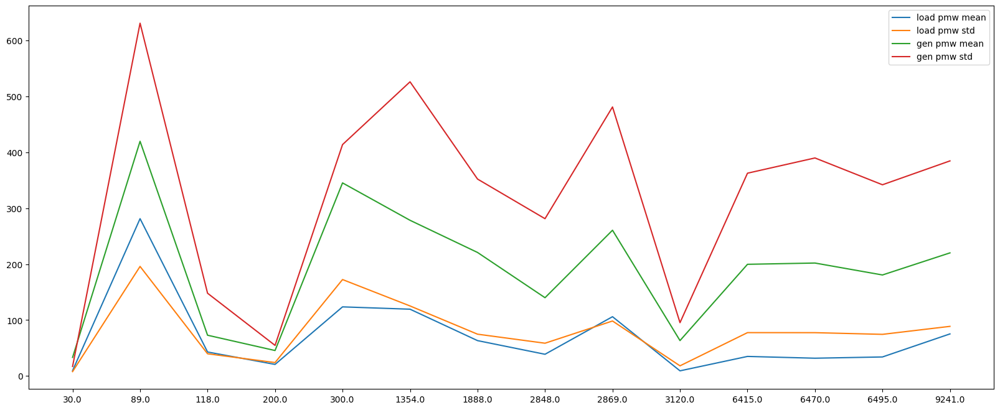

In [ ]:
# plt.figure(figsize=(19,6))
ff[[
    #  'size',
    #  'load pmw sum',
     'load pmw mean',
     'load pmw std',
    #  'load qmvar sum',
    #   'load qmvar mean',
    #   'load qmvar std',
    #   'bus vnkv sum',
    #    'bus vnkv mean',
    #   'bus vnkv std',
    #   'gen pmw sum',
      'gen pmw mean',
       'gen pmw std',
    #   'gen maxpmw sum',
    #   'gen maxpmw mean',
    #   'gen maxpmw std',
    #    'gen min qmvar sum',
    #   'gen min qmvar mean',
    #   'gen min qmvar std',
    #    'gen max qmvar sum',
    #   'gen max qmvar mean',
    #   'gen max qmvar std',
    #    'gen mpw number',
    #   'gen mpw not zero number'
    ]].plot(figsize=(20,8))
plt.xticks(ff.index,ff['size']);
# plt.plot(ff.index,ff['size']*np.log(ff['size'])/60)
plt.show()

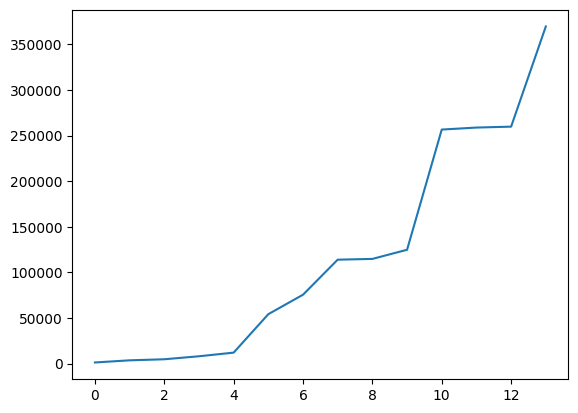

In [ ]:
plt.plot(ff.index,ff['size']*40)
plt.show()

In [ ]:
ff['size']

0       30.0
1       89.0
2      118.0
3      200.0
4      300.0
5     1354.0
6     1888.0
7     2848.0
8     2869.0
9     3120.0
10    6415.0
11    6470.0
12    6495.0
13    9241.0
Name: size, dtype: float64

In [ ]:
np.log(9241)/np.log(300),1400/100

(1.6009385744393139, 14.0)

# resume2

Mounted at /content/drive


In [ ]:
ff.to_csv('/content/drive/MyDrive/power network data/data_noindex.csv',index=False)

# resume3

In [ ]:
l = 1
Nett = pn.case118()
sigma,mu  = Nett['gen']['p_mw'].std(),Nett['gen']['p_mw'].mean()
sigma,mu = sigma*l,mu*l
s3 = np.abs(np.random.normal(mu, sigma,int(30*l)))

In [ ]:
s3.shape[0]

30

In [ ]:
ss3 = np.random.choice(s3.shape[0], (int(s3.shape[0]/4),4), replace=False)

In [ ]:
ss3.shape

(7, 4)

In [ ]:
i = 6
h = s3[ss3[i]].sum()
# print(h*0.8)
s3[ss3[i][0]] = h*0.8
s3[ss3[i][1]] = h*0.1
s3[ss3[i][2]] = h*0.07
s3[ss3[i][3]] = h*(1-0.8-0.1-0.07)
# s3[ss3[i]][/

In [ ]:
# s3[ss3[i][0]] = 100

In [ ]:
s3

array([ 44.42799318, 183.17574068,  31.18590864,  21.83013605,
       548.74177716,  24.62159432,  59.84543932,  19.34017799,
       656.57584862,  19.04056851, 507.74849347,  19.64498033,
        20.57781664,  17.95363179,  45.12708198,  28.06425761,
       224.5140609 ,  41.89180752,  57.45038675,   8.41927728,
        63.46856168, 249.48726912,  48.0149055 , 515.73807983,
        82.07198108,   9.35577259, 478.76351453,  64.46725998,
       211.59888671,  68.59272214])

In [ ]:
s3

array([163.7737088 , 183.17574068,  18.13197201, 140.63163482,
        36.04473042,  24.62159432, 150.87167562, 119.01760832,
       656.57584862,  61.08679412, 122.73776653,  27.11960934,
       173.63805275, 196.57144878, 206.79531399, 137.04643371,
        49.19877188, 129.70207594,  57.45038675,  67.2777612 ,
       287.08734738,  64.47097998, 138.16399247, 300.21910355,
        82.07198108,  88.62449958, 121.30919282,  18.64057393,
       211.59888671, 338.08044582])

In [ ]:
a = 5. # shape
samples = 1000
s = np.random.power(a, samples)

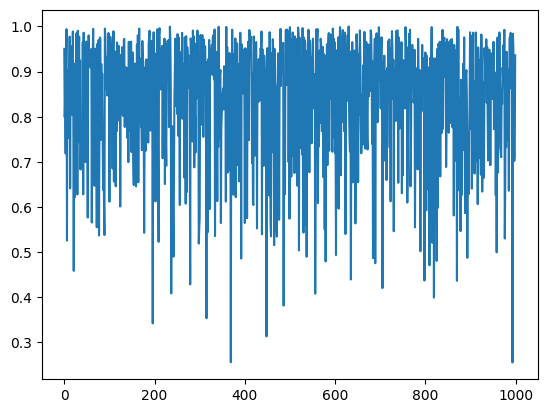

In [ ]:
plt.plot(s)

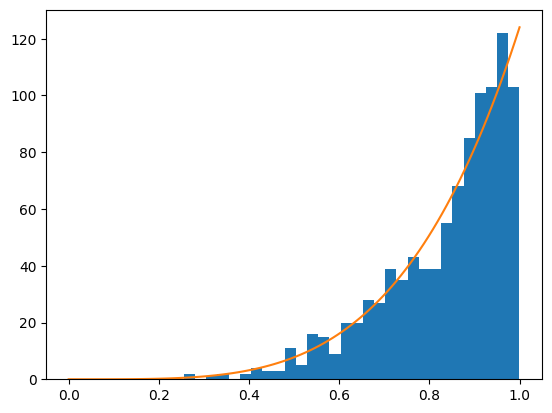

In [ ]:
import matplotlib.pyplot as plt
count, bins, ignored = plt.hist(s, bins=30)
x = np.linspace(0, 1, 100)
y = a*x**(a-1.)
normed_y = samples*np.diff(bins)[0]*y
plt.plot(x, normed_y)
plt.show()

# resume4

In [ ]:
nodes = 200
net = create_network1O1(nodes=nodes,k=4,p=0.1)
# Net = net.copy()


In [ ]:
net2 = pp.pandapowerNet(net)
# net2 = pn.case_illinois200()
G_com,Net,G_power,target,G_power_nodes_Number = create_net(net2)

Networks settings are Done!


In [ ]:
a = net2['gen'][['p_mw','bus']]

In [ ]:
a = a.sort_values('bus')
b = b.sort_values('bus')

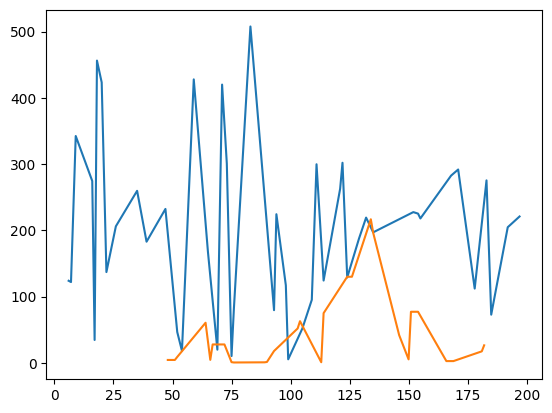

In [ ]:
plt.plot(a['bus'],a['p_mw'])
plt.plot(b['bus'],b['p_mw'])

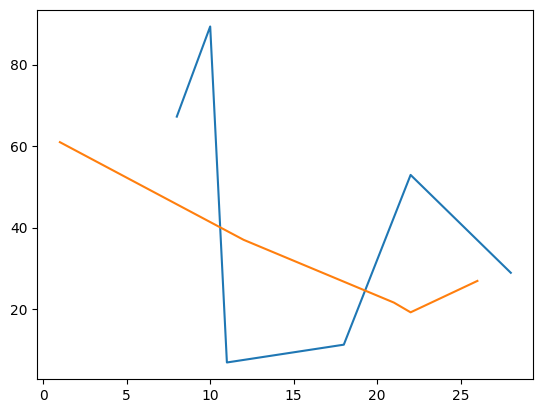

In [ ]:
plt.plot(a['bus'],a['p_mw'])
plt.plot(b['bus'],b['p_mw'])

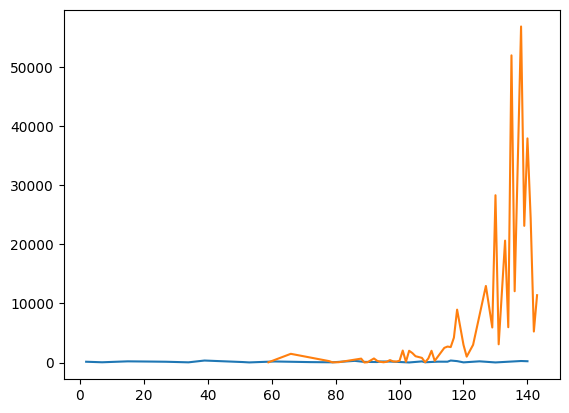

In [ ]:
plt.plot(a['bus'],a['p_mw'])
plt.plot(b['bus'],b['p_mw'])

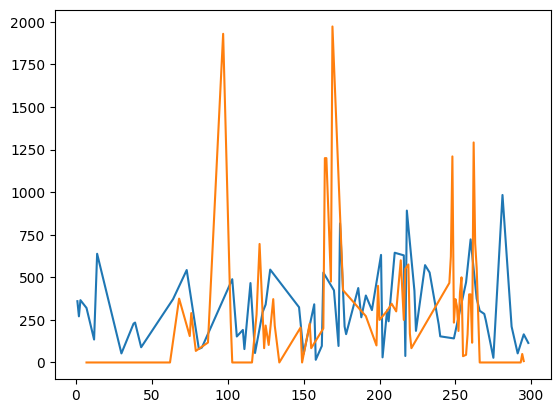

In [ ]:
plt.plot(a['bus'],a['p_mw'])
plt.plot(b['bus'],b['p_mw'])

In [ ]:
net2['gen']['p_mw'].sum()

23479.43

In [ ]:
net2['gen']

,name,bus,p_mw,vm_pu,sn_mva,min_q_mvar,max_q_mvar,scaling,slack,in_service,slack_weight,type,min_p_mw,max_p_mw
0,gen 0,115,466.314619,1.0,NaN,-50.847458,50.847458,1.0,False,True,0.0,None,0.0,699.471929
1,gen 1,33,118.590698,1.0,NaN,-50.847458,50.847458,1.0,False,True,0.0,None,0.0,177.886047
2,gen 2,38,228.178571,1.0,NaN,-50.847458,50.847458,1.0,False,True,0.0,None,0.0,342.267856
3,gen 3,173,96.999641,1.0,NaN,-50.847458,50.847458,1.0,False,True,0.0,None,0.0,145.499461
4,gen 4,217,38.056366,1.0,NaN,-50.847458,50.847458,1.0,False,True,0.0,None,0.0,57.084549
5,gen 5,162,97.063244,1.0,NaN,-50.847458,50.847458,1.0,False,True,0.0,None,0.0,145.594867
6,gen 6,83,87.658747,1.0,NaN,-50.847458,50.847458,1.0,False,True,0.0,None,0.0,131.488121
7,gen 7,157,341.590002,1.0,NaN,-50.847458,50.847458,1.0,False,True,0.0,None,0.0,512.385004
8,gen 8,64,371.678607,1.0,NaN,-50.847458,50.847458,1.0,False,True,0.0,None,0.0,557.517910
9,gen 9,223,420.419254,1.0,NaN,-50.847458,50.847458,1.0,False,True,0.0,None,0.0,630.628882


In [ ]:
G = G_com
pathlengths = []
jk = {}


print("source vertex {target:length, }")
for v in G.nodes():
    spl = dict(nx.single_source_shortest_path_length(G, v))
    # print(f"{v} {np.mean(list(spl.values()))} ")
    jk[v] = np.mean(list(spl.values()))
    # for p in spl:
    #     pathlengths.append(spl[p])

source vertex {target:length, }


In [ ]:
# jk

In [ ]:
myKeys = list(jk.keys())
myKeys.sort()
sorted_dict = {i: jk[i] for i in myKeys}

# print(sorted_dict)

In [ ]:
a = list(pd.DataFrame.from_dict(sorted_dict,orient='index')[0])
# a

In [ ]:
G = G_com
pathlengths = []
# nx.clustering(nx.Graph(G))
# nx.average_neighbor_degree(G, source="out", target="out")
c = dict(G.degree)

In [ ]:
myKeys = list(c.keys())
myKeys.sort()
sorted_dict = {i: c[i] for i in myKeys}

# print(sorted_dict)

In [ ]:
b = list(pd.DataFrame.from_dict(sorted_dict,orient='index')[0])

In [ ]:
c = pd.DataFrame()
c['deg'] = b
c['shrt'] = a

In [ ]:
n = c[1:]

In [ ]:
b2 = list(p[0])

In [ ]:
n['dmg'] = np.array(b2) * 10
# n

In [ ]:
net2['gen']

,name,bus,p_mw,vm_pu,sn_mva,min_q_mvar,max_q_mvar,scaling,slack,in_service,slack_weight,type,min_p_mw,max_p_mw
0,gen 0,115,466.314619,1.0,NaN,-50.847458,50.847458,1.0,False,True,0.0,None,0.0,699.471929
1,gen 1,33,118.590698,1.0,NaN,-50.847458,50.847458,1.0,False,True,0.0,None,0.0,177.886047
2,gen 2,38,228.178571,1.0,NaN,-50.847458,50.847458,1.0,False,True,0.0,None,0.0,342.267856
3,gen 3,173,96.999641,1.0,NaN,-50.847458,50.847458,1.0,False,True,0.0,None,0.0,145.499461
4,gen 4,217,38.056366,1.0,NaN,-50.847458,50.847458,1.0,False,True,0.0,None,0.0,57.084549
5,gen 5,162,97.063244,1.0,NaN,-50.847458,50.847458,1.0,False,True,0.0,None,0.0,145.594867
6,gen 6,83,87.658747,1.0,NaN,-50.847458,50.847458,1.0,False,True,0.0,None,0.0,131.488121
7,gen 7,157,341.590002,1.0,NaN,-50.847458,50.847458,1.0,False,True,0.0,None,0.0,512.385004
8,gen 8,64,371.678607,1.0,NaN,-50.847458,50.847458,1.0,False,True,0.0,None,0.0,557.517910
9,gen 9,223,420.419254,1.0,NaN,-50.847458,50.847458,1.0,False,True,0.0,None,0.0,630.628882


<Axes: >

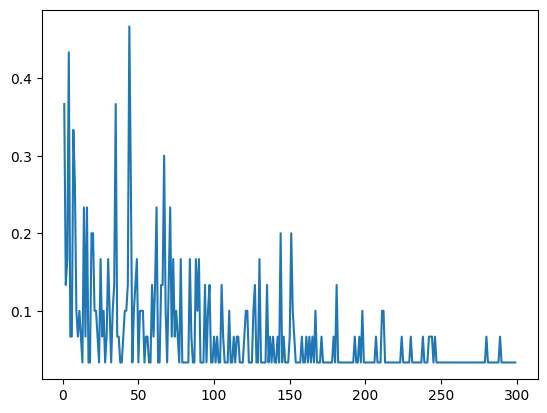

In [ ]:
n['dmg'].plot()

<Axes: >

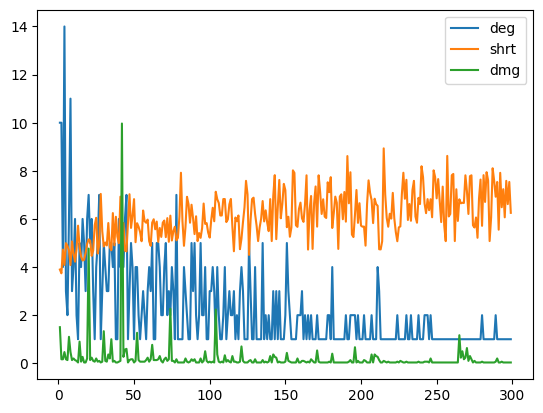

In [ ]:
n.plot()

<Axes: >

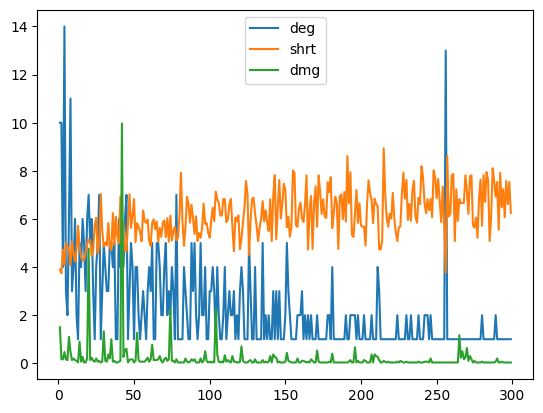

In [ ]:
n.plot()

<Axes: >

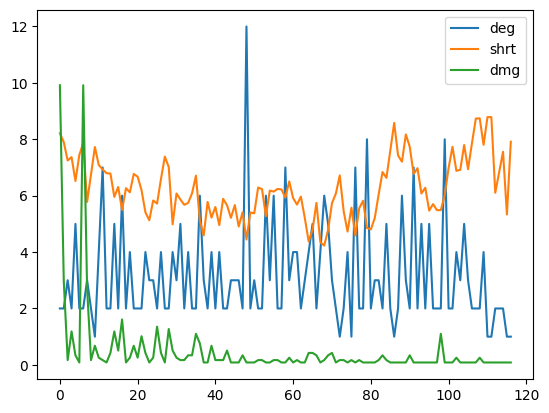

In [ ]:
n.plot()

<Axes: >

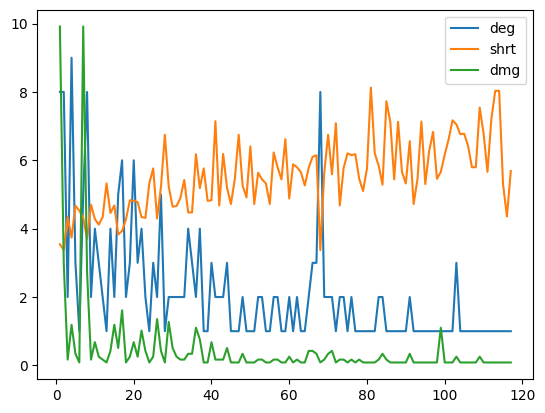

In [ ]:
n.plot()

<Axes: >

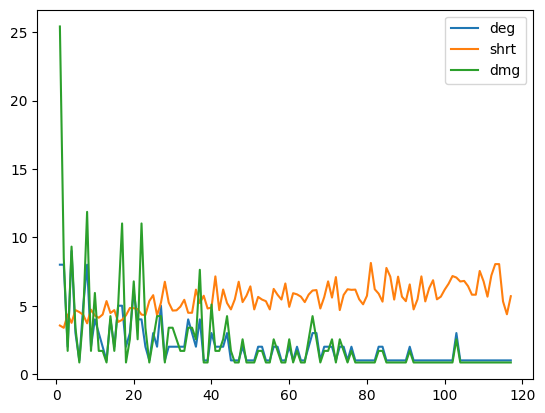

In [ ]:
n.plot()

<Axes: >

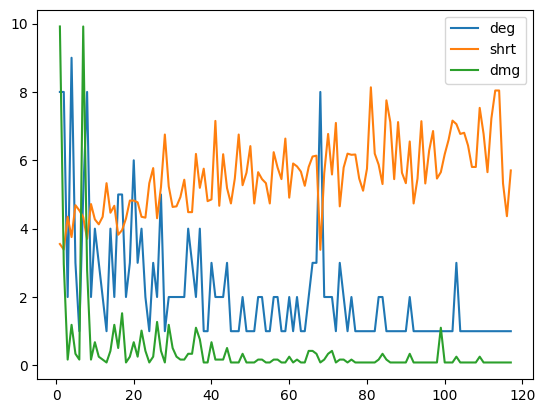

In [ ]:
n.plot()

<Axes: >

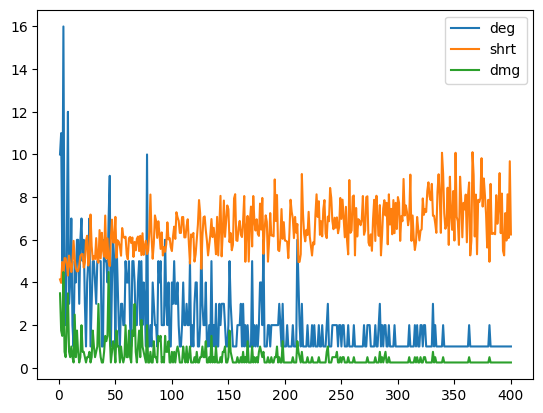

In [ ]:
n.plot()

# doing some slacks see whats happen??

In [ ]:
def gen_gy_simple(net,num1,num2,tries,ids):
    np.random.seed(seed)

    a = len(net['gen'])
    b = int(a * abs(num1))
    c = np.random.randint(0,a,(tries,b))
    # print(c)
    kl = np.array(list(set(c[ids])))
    for i in kl:
        net.gen['p_mw'].iloc[i] *= (1+num2)
        net.gen['max_p_mw'].iloc[i] *= (1+num2)
    name = ''
    for j in kl[0:-1]:
        name += f'{j}-'
    j = kl[-1]
    name += f'{j}'
    # names = c

    return net,name

In [ ]:
def gen_gy_simple_slack(net,num1,num2,tries,ids):
    np.random.seed(seed)

    a = len(net['gen'])
    b = int(a * abs(num1))
    c = np.random.randint(0,a,(tries,b))
    # print(c)
    for i in c[ids]:
        net.gen['slack'].iloc[i] = True
        # net.gen['max_p_mw'].iloc[i] *= (1+num2)
    name = ''
    for j in c[ids][0:-1]:
        name += f'{j}-'
    j = c[ids][-1]
    name += f'{j}'
    # names = c

    return net,name

In [ ]:
nodes = 200
net3 = create_network1O1(nodes=nodes,k=4,p=0.25)
# net3 = pn.case300()
# nodes = 300

<Axes: >

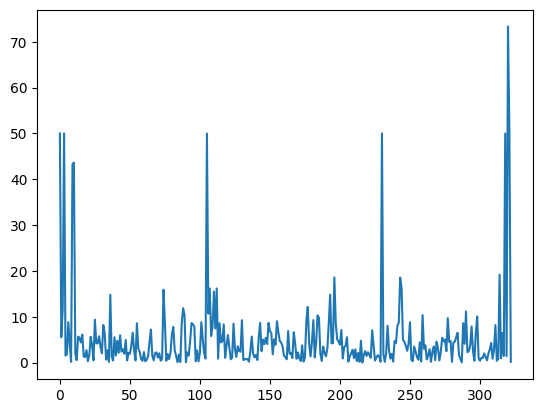

In [ ]:
net3['res_line']['loading_percent'].plot()

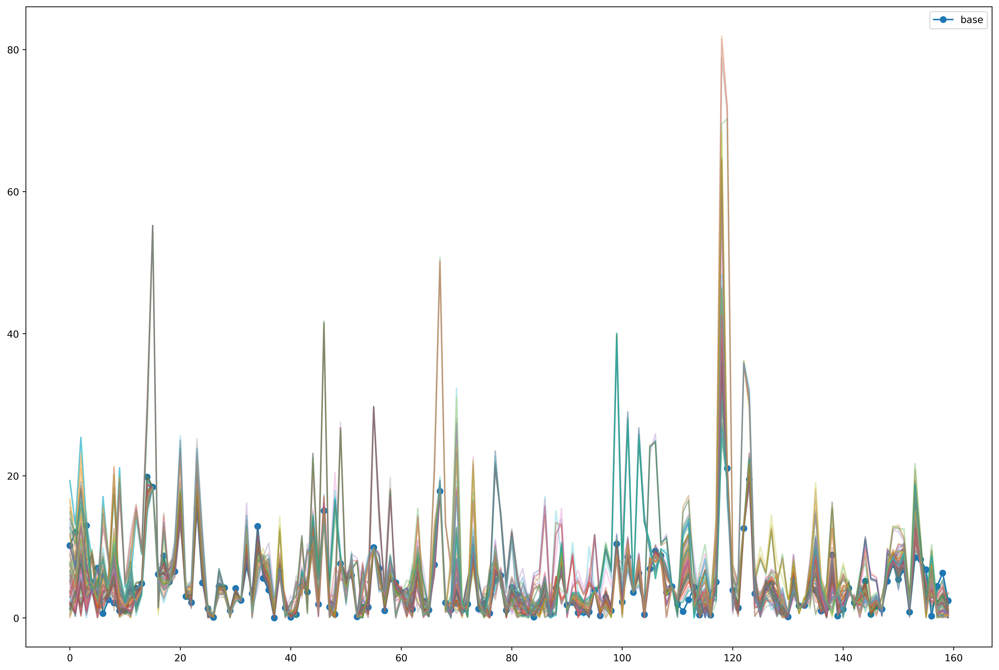

In [ ]:
plt.figure(figsize=(18,12),dpi=500)
pi = {}
pi2 = {}
net_base = pp.pandapowerNet(net3)
G_com,Net,G_power,target,G_power_nodes_Number = create_net(net_base)
bb1 = net_analysis2(G_power)
bb2 = net_analysis2(G_com)
num1 = 0.1
num2 = 0.3
tries = 100
gg1 = {}
gg2 = {}

# plt.plot(net['res_line']['loading_percent'],label=f'{name}',alpha=0.3)
for ids in range(tries):
    np.random.seed(0),np.random.rand(seed)
    net = pp.pandapowerNet(net3)
    if ids == 0:
        name = 'base'
        # print(net.gen['p_mw'].sum())
        pp.rundcpp(net)
        plt.plot(net['res_line']['loading_percent']
                 ,label=f'{name}',marker='o'
                ,alpha=1)
    elif ids > 0:
        # net ,name= gen_gy_simple(net,num1,num2,bb1,bb2,tries,ids)
        net ,name= gen_gy_simple(net,num1,num2,tries,ids)
        # name = 'not base'
        # print(net.gen['p_mw'].sum())
        pp.rundcpp(net)
        plt.plot(net['res_line']['loading_percent']
                #  ,label=f'{name}'
                ,alpha=0.3)

# # #         color='green', marker='o', linestyle='dashed',
# # # ...      linewidth=2, markersize=12
    # gg = {}
    # for kk in range(1,nodes):
    #     np.random.seed(0),np.random.rand(seed)
    #     net2 = pp.pandapowerNet(net)
    #     # print(net2.gen['p_mw'].sum())
    #     G_com,Net,G_power,target,G_power_nodes_Number = create_net(net2)
    #     # print(Net.gen['p_mw'].sum())
    #     G_com,Net,G_power = Remove_by_purpose(remove=kk)
    #     rm_nodes = set() - set()
    #     casecading = True
    #     while casecading:
    #         G_com = Largest_component_with_target(G_com,target)
    #         G_power = Largest_component_with_target(G_power,target)
    #         End_minus_One_of_casecade = (len(G_com.nodes()),len(G_power.nodes()))
    #         set_nodes = set(G_com.nodes() - G_power.nodes())
    #         if len(set_nodes)==0:
    #             set_nodes = set(G_power.nodes() - G_com.nodes())
    #         if len(set_nodes) != 0:
    #             # print("removed node/nodes in this time in casecading",set_nodes)
    #             Net = Casecade_in_pow(Net, set_nodes)
    #             G_power = top.create_nxgraph(Net)
    #             G_com = Casecade_in_com(G_com, set_nodes)
    #             # print("in line 127 ",self.G_com.nodes)
    #         End_of_casecade = (len(G_com.nodes()),len(G_power.nodes()))
    #         if End_minus_One_of_casecade == End_of_casecade:
    #             casecading = False
    #     # plt.plot(Net['res_line']['loading_percent'],label=f'{kk}',alpha=0.05)
    #     if name == 'base':
    #         gg1[f'{kk}'] = np.array(Net['res_line']['loading_percent'])
    #     else:
    #         gg2[f'{kk}'] = np.array(Net['res_line']['loading_percent'])

    # plt.label(f'{name}')
    # plt.legend()
    # plt.show()
            # print(self.casecading)
        # print(f'for removing {kk} with slacks {name}: ',1 - net2['bus'].shape[0]/nodes)
        # gg[f'{kk}-{bb1[kk]}-{bb2[kk]}'] = 1 - net2['bus'].shape[0]/nodes
        # gg[f'{kk}'] = 1 - net2['bus'].shape[0]/nodes

    # p = pd.DataFrame.from_dict(gg,orient='index')
    # pi[name] = list(np.array(p).reshape(-1,))
    # pi2[name] = np.sum(list(np.array(p).reshape(-1,)))
    # print(np.sum(list(np.array(p).reshape(-1,))))
    # plt.plot(p,label=f'{name}',alpha=0.3)
plt.legend()
plt.show()

In [ ]:
def gen_gy_simple(net,num1,num2,tries,ids):
    np.random.seed(seed)

    a = len(net['gen'])
    b = int(a * abs(num1))
    c = np.random.randint(0,a,(tries,b))
    # print(c)
    kl = np.array(list(set(c[ids])))
    for i in kl:
        net.gen['p_mw'].iloc[i] *= (1+num2)
        net.gen['max_p_mw'].iloc[i] *= (1+num2)
    name = ''
    for j in kl[0:-1]:
        name += f'{j}-'
    j = kl[-1]
    name += f'{j}'
    # names = c
    l_en = len(kl)
    return net,name,l_en

In [ ]:
### this should be modified in actual code ###
def Casecade_in_pow(Net,nodes):
    np.random.seed(seed)

    Net = Net
    node = nodes
    if len(node) == 0:
        # self.node = instance_nodes - nodes
        busses = []
    elif len(node) == 1:
        busses = node
    else:

        busses = list(node)
    try:
        pp.drop_buses(Net,buses=busses,drop_elements = True)
    except:pass

    pp.rundcpp(Net)
    lpass = Net['res_line']['loading_percent']
    drop_lines = pp.overloaded_lines(Net)
    while len(drop_lines) !=0:
        # print("3")
        pp.drop_lines(Net,drop_lines)
        pp.rundcpp(Net)
        drop_lines = pp.overloaded_lines(Net)
        # print("line 135 worked.",self.drop_lines)
    g_inst = top.create_nxgraph(Net)
    g_inst_2 = Largest_component_with_target(g_inst,target)
    set_nodes_2 = set(g_inst) - set(g_inst_2)
    pp.drop_buses(Net,set_nodes_2,drop_elements = True)
    return Net,lpass



0


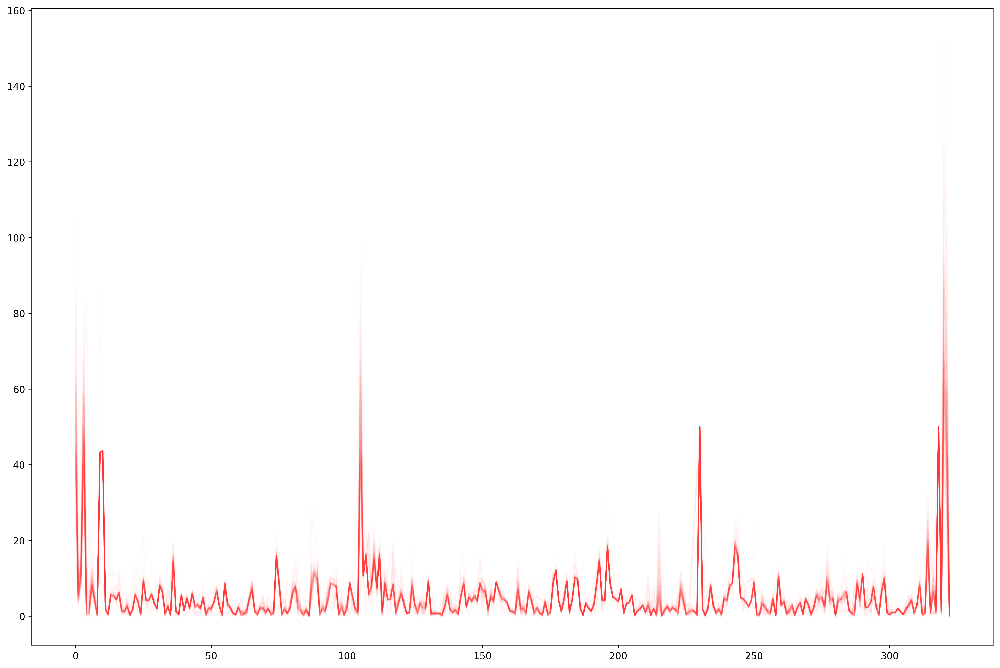

In [ ]:
plt.figure(figsize=(18,12),dpi=500)
pi = {}
pi2 = {}
net_base = pp.pandapowerNet(net3)
G_com,Net,G_power,target,G_power_nodes_Number = create_net(net_base)
bb1 = net_analysis2(G_power)
bb2 = net_analysis2(G_com)
num1 = 0.1
num2 = 0.3
tries = 1
gg1 = {}
gg2 = {}

# plt.plot(net['res_line']['loading_percent'],label=f'{name}',alpha=0.3)
for ids in range(tries):
    print(ids)
    np.random.seed(0),np.random.rand(seed)
    net = pp.pandapowerNet(net3)
    if ids == 0:
        name = 'base'
        # print(net.gen['p_mw'].sum())
        pp.rundcpp(net)
        # plt.plot(net['res_line']['loading_percent']
        #          ,label=f'{name}',marker='o'
        #         ,alpha=1)
        l_en = 0
    elif ids > 0:
        # net ,name= gen_gy_simple(net,num1,num2,bb1,bb2,tries,ids)
        net ,name,l_en= gen_gy_simple(net,num1,num2,tries,ids)
        # name = 'not base'
        # print(net.gen['p_mw'].sum())
        pp.rundcpp(net)
        # plt.plot(net['res_line']['loading_percent']
        #         #  ,label=f'{name}'
        #         ,alpha=0.3)

# # #         color='green', marker='o', linestyle='dashed',
# # # ...      linewidth=2, markersize=12
    gg = {}
    h = []
    for kk in range(1,nodes):
        np.random.seed(0),np.random.rand(seed)
        net2 = pp.pandapowerNet(net)
        # print(net2.gen['p_mw'].sum())
        G_com,Net,G_power,target,G_power_nodes_Number = create_net(net2)
        # print(Net.gen['p_mw'].sum())
        G_com,Net,G_power = Remove_by_purpose(remove=kk)
        rm_nodes = set() - set()
        casecading = True
        while casecading:
            G_com = Largest_component_with_target(G_com,target)
            G_power = Largest_component_with_target(G_power,target)
            End_minus_One_of_casecade = (len(G_com.nodes()),len(G_power.nodes()))
            set_nodes = set(G_com.nodes() - G_power.nodes())
            if len(set_nodes)==0:
                set_nodes = set(G_power.nodes() - G_com.nodes())
            if len(set_nodes) != 0:
                # print("removed node/nodes in this time in casecading",set_nodes)
                Net,lpass = Casecade_in_pow(Net, set_nodes)
                if ids == 0:
                    plt.plot(lpass,label=f'{kk}',alpha=0.01,color='r')
                else:
                    plt.plot(lpass,label=f'{kk}',alpha=0.01,color='b')

                G_power = top.create_nxgraph(Net)
                G_com = Casecade_in_com(G_com, set_nodes)
                # print("in line 127 ",self.G_com.nodes)
            End_of_casecade = (len(G_com.nodes()),len(G_power.nodes()))
            if End_minus_One_of_casecade == End_of_casecade:
                casecading = False
        # plt.plot(Net['res_line']['loading_percent'],label=f'{kk}',alpha=0.05)
        # if name == 'base':
        # gg[f'{kk}'] = np.array(Net['res_line']['loading_percent'])
        # plt.plot(Net['res_line']['loading_percent']
        #  ,label=f'{name}'
        # ,alpha=0.005)
        # else:
        # gg[f'{kk}'] = np.array(Net['res_line']['loading_percent'])

        # print(f'[{ids}] - for removing {kk} with {l_en} slacks {name}: ',(1 - net2['bus'].shape[0]/nodes)*100)
        h.append((1 - net2['bus'].shape[0]/nodes)*100)
        # gg[f'{kk}-{bb1[kk]}-{bb2[kk]}'] = 1 - net2['bus'].shape[0]/nodes
        gg[f'{kk}'] = 1 - net2['bus'].shape[0]/nodes
    # pi[name] = np.sum(h)
    pi[name] = h

    # p = pd.DataFrame.from_dict(gg,orient='index')
    # pi[name] = list(np.array(p).reshape(-1,))
    pi2[name] = gg
    # print(np.sum(list(np.array(p).reshape(-1,))))
    # plt.plot(p,label=f'{name}',alpha=0.3)
# plt.legend()
# plt.ylim(0,15)
plt.show()

In [ ]:
gh = pd.DataFrame(pi['base'])
gh1 = np.array(gh[gh[0] > 3].index)
gh = gh1+1

In [ ]:
np.linspace(-0.8,0.8,)

array([-0.8       , -0.78383838, -0.76767677, -0.75151515, -0.73535354,
       -0.71919192, -0.7030303 , -0.68686869, -0.67070707, -0.65454545,
       -0.63838384, -0.62222222, -0.60606061, -0.58989899, -0.57373737,
       -0.55757576, -0.54141414, -0.52525253, -0.50909091, -0.49292929,
       -0.47676768, -0.46060606, -0.44444444, -0.42828283, -0.41212121,
       -0.3959596 , -0.37979798, -0.36363636, -0.34747475, -0.33131313,
       -0.31515152, -0.2989899 , -0.28282828, -0.26666667, -0.25050505,
       -0.23434343, -0.21818182, -0.2020202 , -0.18585859, -0.16969697,
       -0.15353535, -0.13737374, -0.12121212, -0.10505051, -0.08888889,
       -0.07272727, -0.05656566, -0.04040404, -0.02424242, -0.00808081,
        0.00808081,  0.02424242,  0.04040404,  0.05656566,  0.07272727,
        0.08888889,  0.10505051,  0.12121212,  0.13737374,  0.15353535,
        0.16969697,  0.18585859,  0.2020202 ,  0.21818182,  0.23434343,
        0.25050505,  0.26666667,  0.28282828,  0.2989899 ,  0.31

In [ ]:
def gen_gy_simple(net,num1,num2,tries,ids,cross):
    np.random.seed(seed)

    a = len(net['gen'])
    b = int(a * abs(num1))
    c = np.random.randint(0,a,(tries,b))
    c2 = np.linspace(0,0.8,tries)
    # print('8')

    # print(c)
    kl = np.array(list(set(c[cross])))
    for i in kl:
        net.gen['p_mw'].iloc[i] *= (1+c2[ids])
        net.gen['max_p_mw'].iloc[i] *= (1+c2[ids])
    name = ''
    # print('16')

    for j in kl[0:-1]:
        name += f'{j}-'
    j = kl[-1]
    name += f'{j}'
    # print('22')

    # names = c
    l_en = len(kl)
    # print(c2)
    return net,name,l_en,c2

In [ ]:
# del c2

In [ ]:
# net ,name,l_en,c2= gen_gy_simple(net,num1,num2,tries,ids,cross)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199


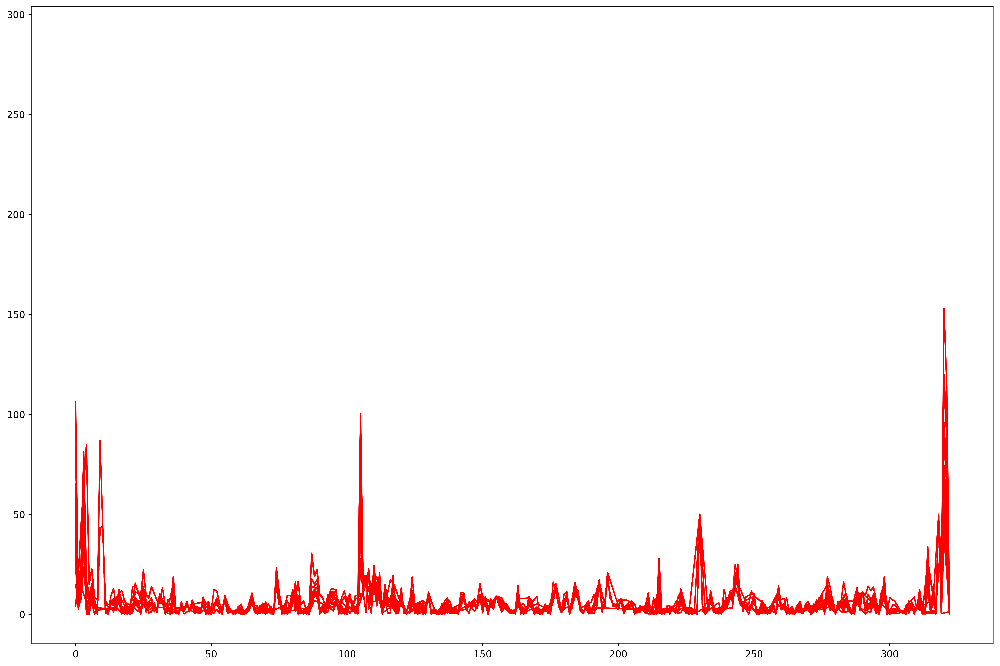

In [ ]:
plt.figure(figsize=(18,12),dpi=500)
pi11 = {}
pi12 = {}

pi2 = {}
net_base = pp.pandapowerNet(net3)
G_com,Net,G_power,target,G_power_nodes_Number = create_net(net_base)
bb1 = net_analysis2(G_power)
bb2 = net_analysis2(G_com)
num1 = 0.5
num2 = 0.3
tries = 200
gg1 = {}
gg2 = {}
cross = 0
# plt.plot(net['res_line']['loading_percent'],label=f'{name}',alpha=0.3)
for ids in range(tries):
    print(ids)
    np.random.seed(0),np.random.rand(seed)
    net = pp.pandapowerNet(net3)
    if ids == 0:
        name = 'base'
        # print(net.gen['p_mw'].sum())
        pp.rundcpp(net)
        # plt.plot(net['res_line']['loading_percent']
        #          ,label=f'{name}',marker='o'
        #         ,alpha=1)
        l_en = 0
        c2 = ['base']
    elif ids > 0:
        # net ,name= gen_gy_simple(net,num1,num2,bb1,bb2,tries,ids)
        net ,name,l_en,c2= gen_gy_simple(net,num1,num2,tries,ids,cross)
        # name = 'not base'
        # print(net.gen['p_mw'].sum())
        pp.rundcpp(net)
        # plt.plot(net['res_line']['loading_percent']
        #         #  ,label=f'{name}'
        #         ,alpha=0.3)

# # #         color='green', marker='o', linestyle='dashed',
# # # ...      linewidth=2, markersize=12
    gg = {}
    h = []
    for kk in gh:
        np.random.seed(0),np.random.rand(seed)
        net2 = pp.pandapowerNet(net)
        # print(net2.gen['p_mw'].sum())
        G_com,Net,G_power,target,G_power_nodes_Number = create_net(net2)
        # print(Net.gen['p_mw'].sum())
        G_com,Net,G_power = Remove_by_purpose(remove=kk)
        rm_nodes = set() - set()
        casecading = True
        while casecading:
            G_com = Largest_component_with_target(G_com,target)
            G_power = Largest_component_with_target(G_power,target)
            End_minus_One_of_casecade = (len(G_com.nodes()),len(G_power.nodes()))
            set_nodes = set(G_com.nodes() - G_power.nodes())
            if len(set_nodes)==0:
                set_nodes = set(G_power.nodes() - G_com.nodes())
            if len(set_nodes) != 0:
                # print("removed node/nodes in this time in casecading",set_nodes)
                Net,lpass = Casecade_in_pow(Net, set_nodes)
                if ids == 0:
                    plt.plot(lpass,label=f'{kk}',alpha=1,color='r')
                else:
                    plt.plot(lpass,label=f'{kk}',alpha=0.0001,color='b')

                G_power = top.create_nxgraph(Net)
                G_com = Casecade_in_com(G_com, set_nodes)
                # print("in line 127 ",self.G_com.nodes)
            End_of_casecade = (len(G_com.nodes()),len(G_power.nodes()))
            if End_minus_One_of_casecade == End_of_casecade:
                casecading = False
        # plt.plot(Net['res_line']['loading_percent'],label=f'{kk}',alpha=0.05)
        # if name == 'base':
        # gg[f'{kk}'] = np.array(Net['res_line']['loading_percent'])
        # plt.plot(Net['res_line']['loading_percent']
        #  ,label=f'{name}'
        # ,alpha=0.005)
        # else:
        # gg[f'{kk}'] = np.array(Net['res_line']['loading_percent'])

        # print(f'[{ids}] - for removing {kk} with {l_en} slacks {name}: ',(1 - net2['bus'].shape[0]/nodes)*100)
        h.append((1 - net2['bus'].shape[0]/nodes)*100)
        # gg[f'{kk}-{bb1[kk]}-{bb2[kk]}'] = 1 - net2['bus'].shape[0]/nodes
        gg[f'{kk}'] = 1 - net2['bus'].shape[0]/nodes
    # pi11[name] = np.sum(h)
    # pi12[name] = h
    pi11[c2[ids]] = np.sum(h)
    pi12[c2[ids]] = h

    # p = pd.DataFrame.from_dict(gg,orient='index')
    # pi[name] = list(np.array(p).reshape(-1,))
    # pi2[name] = gg
    pi2[c2[ids]] = gg

    # print(np.sum(list(np.array(p).reshape(-1,))))
    # plt.plot(p,label=f'{name}',alpha=0.3)
# plt.legend()
# plt.ylim(0,15)
plt.show()

In [ ]:
p = pd.DataFrame.from_dict(pi11,orient='index')

In [ ]:
p

,0
base,67.5
0.004020100502512563,68.5
0.008040201005025126,68.5
0.01206030150753769,68.5
0.016080402010050253,68.5
0.020100502512562818,68.5
0.02412060301507538,68.5
0.02814070351758794,68.5
0.032160804020100506,67.5
0.03618090452261307,67.5


<Axes: >

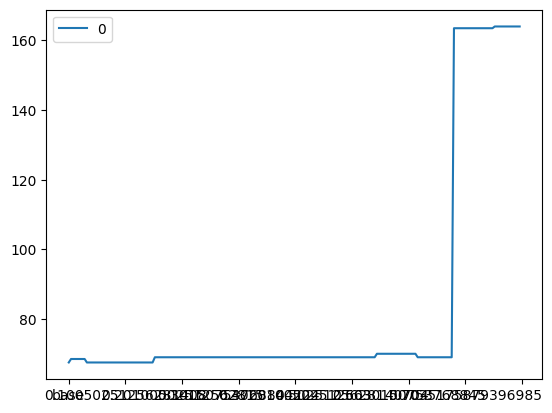

In [ ]:
p.plot()

In [ ]:
s = list(pi2.keys())

13


<Axes: >

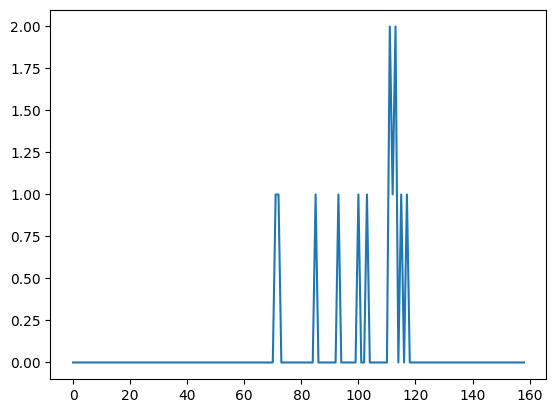

In [ ]:
i = -1
p = pd.DataFrame.from_dict(pi2[s[i]],orient='index')
p.fillna(np.nan,inplace=True)
print(np.sum(np.sum(p>50)))
np.sum(p>50).plot()

<Axes: >

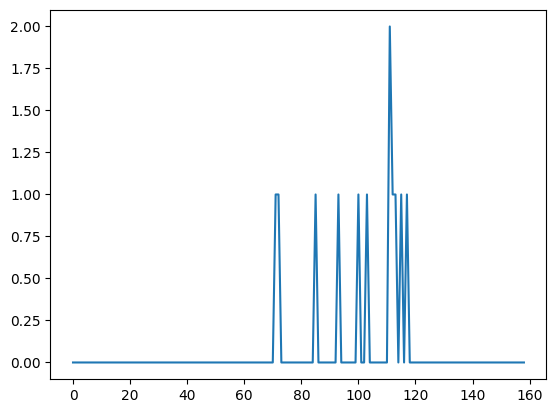

In [ ]:
np.sum(p>50).plot()

In [ ]:
p1 = pd.DataFrame.from_dict(gg1,orient='index')
p2 = pd.DataFrame.from_dict(gg2,orient='index')
p1.fillna(np.nan,inplace=True)
p2.fillna(np.nan,inplace=True)

In [ ]:
1 - np.sum(np.sum(p1==p2))/(p1.shape[0]*p1.shape[1])

0.9811956038371132

In [ ]:
p2

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158
1,39.388258,24.981938,5.800769,10.521374,4.967524,21.189416,15.152101,9.134144,18.410509,5.785042,7.848955,15.805413,1.406706,3.689079,13.958588,6.618845,2.648903,0.263351,7.397678,8.627407,14.215032,15.127122,0.553111,1.098501,0.707911,1.096250,1.595794,5.020899,1.950399,11.494849,18.810881,3.913826,5.035664,6.952937,1.761385,0.399404,3.178382,9.909350,6.430471,1.622582,6.000055,4.269004,0.931967,4.089702,7.424366,1.453342,2.636906,7.264779,1.033398,7.620141,8.668204,1.300683,8.623898,3.756458,7.666292,11.531201,3.268982,3.935592,3.205924,1.039683,4.947375,5.008109,8.971533,4.369620,10.946245,4.413348,0.243715,1.631532,0.353271,0.814325,18.613381,66.240116,72.396657,25.464927,5.222031,8.407514,1.482358,9.549912,1.147977,2.386422,7.662829,16.867593,2.571290,4.850479,16.278454,4.381593,11.871967,1.297492,0.446305,7.120766,14.401685,7.128782,23.962937,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000
2,20.385043,19.855622,20.830741,9.533425,2.945617,0.732919,1.762249,4.839212,3.135473,4.641944,20.793162,18.410509,7.943027,11.492169,6.107894,2.134184,0.037553,0.989627,6.643343,6.923063,6.512324,1.434366,7.122990,3.365215,5.595988,3.356852,9.711799,4.617624,15.807619,6.340953,5.779111,2.169149,6.115122,0.426448,0.840402,5.460185,2.016746,9.823876,6.149252,8.801617,0.259778,7.760593,12.311453,12.337332,2.698352,5.773461,4.034060,15.495024,3.116801,1.721440,15.980985,18.306566,2.637374,9.991743,32.344416,0.559476,1.948236,1.889682,2.344685,4.780223,5.629665,4.982273,0.357386,13.356698,3.901802,0.929897,2.025227,0.291858,17.093773,8.185151,3.590173,5.078540,5.009224,11.387892,6.405421,1.630254,4.413348,4.297109,1.519972,0.111560,2.321201,2.687001,6.530031,3.259912,11.582587,68.943983,19.865997,5.292908,2.743445,12.872024,0.417414,2.371113,1.548404,1.304134,7.455608,2.864730,0.035664,2.328334,10.842346,1.369646,0.623274,5.199876,1.137446,6.004393,3.106231,1.748448,2.448864,0.775598,5.860509,7.207624,5.942172,6.887667,1.110595,6.586893,8.431690,9.433276,1.852813,6.427878,8.427979,2.505595,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000
3,9.308028,11.260096,4.819525,12.255991,6.213784,6.932810,2.702399,1.621910,2.028461,5.668066,21.613397,18.410509,5.416929,9.786306,4.824559,6.091888,13.561114,2.977238,1.809046,14.826801,4.009429,1.558997,0.151128,4.032273,5.185955,5.820712,3.652459,10.094219,4.619551,3.144278,0.111333,6.170596,1.083226,0.165665,0.223262,4.224930,3.311123,10.078500,1

23479.43
5.779999999999998
27349.43
5.779999999999998
25498.43
5.779999999999998
24798.43
5.779999999999998
24909.43
5.779999999999998


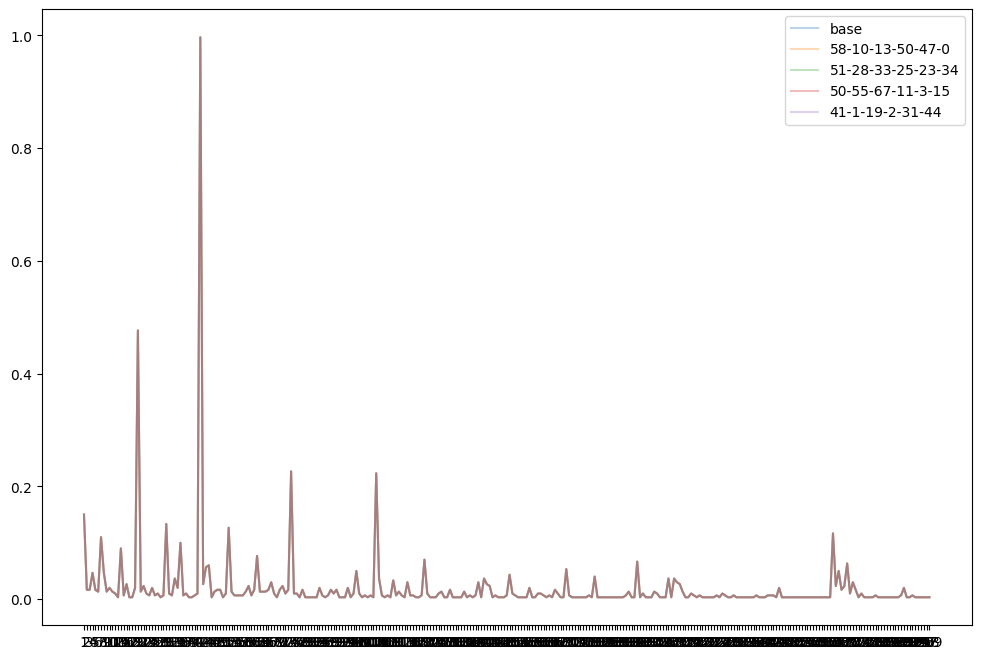

In [ ]:
plt.figure(figsize=(12,8))
pi = {}
pi2 = {}
net_base = pp.pandapowerNet(net3)
G_com,Net,G_power,target,G_power_nodes_Number = create_net(net_base)
bb1 = net_analysis2(G_power)
bb2 = net_analysis2(G_com)
num1 = 0.1
num2 = 1
tries = 5
for ids in range(tries):
    np.random.seed(0),np.random.rand(seed)
    net = pp.pandapowerNet(net3)
    if ids == 0:
        name = 'base'
        print(net.gen['p_mw'].sum())
    elif ids > 0:
        # net ,name= gen_gy_simple(net,num1,num2,bb1,bb2,tries,ids)
        net ,name= gen_gy_simple(net,num1,num2,tries,ids)

        # print(net.gen['p_mw'].sum())

    gg = {}
    for kk in range(1,nodes):
        np.random.seed(0),np.random.rand(seed)
        net2 = pp.pandapowerNet(net)
        # print(net2.gen['p_mw'].sum())
        G_com,Net,G_power,target,G_power_nodes_Number = create_net(net2)
        # print(Net.gen['p_mw'].sum())
        G_com,Net,G_power = Remove_by_purpose(remove=kk)
        rm_nodes = set() - set()
        casecading = True
        while casecading:
            G_com = Largest_component_with_target(G_com,target)
            G_power = Largest_component_with_target(G_power,target)
            End_minus_One_of_casecade = (len(G_com.nodes()),len(G_power.nodes()))
            set_nodes = set(G_com.nodes() - G_power.nodes())
            if len(set_nodes)==0:
                set_nodes = set(G_power.nodes() - G_com.nodes())
            if len(set_nodes) != 0:
                # print("removed node/nodes in this time in casecading",set_nodes)
                Net = Casecade_in_pow(Net, set_nodes)
                G_power = top.create_nxgraph(Net)
                G_com = Casecade_in_com(G_com, set_nodes)
                # print("in line 127 ",self.G_com.nodes)
            End_of_casecade = (len(G_com.nodes()),len(G_power.nodes()))
            if End_minus_One_of_casecade == End_of_casecade:
                casecading = False
            # print(self.casecading)
        # print(f'for removing {kk} with slacks {name}: ',1 - net2['bus'].shape[0]/nodes)
        # gg[f'{kk}-{bb1[kk]}-{bb2[kk]}'] = 1 - net2['bus'].shape[0]/nodes
        gg[f'{kk}'] = 1 - net2['bus'].shape[0]/nodes

    p = pd.DataFrame.from_dict(gg,orient='index')
    pi[name] = list(np.array(p).reshape(-1,))
    pi2[name] = np.sum(list(np.array(p).reshape(-1,)))
    print(np.sum(list(np.array(p).reshape(-1,))))
    plt.plot(p,label=f'{name}',alpha=0.3)
plt.legend()
plt.show()

In [ ]:
op = list(pi2.keys())
opp = np.zeros((len(op),1))
# opp.shape
for i,j in enumerate(pi2.keys()):
    opp[i] = pi2[j]
s = pd.DataFrame(opp,index=pi2.keys())
s.columns = ['slacks']
s

,slacks
base,4.13
4-2-10-13-7,4.13
18-15-2-8-9,4.13
8-0-4-1-8,4.13
2-18-3-11-3,4.13
15-14-5-17-8,4.13
9-1-13-2-15,4.13
12-7-1-10-5,4.13
17-8-7-10-5,4.13
13-10-3-8-10,4.13


In [ ]:
op = list(pi2.keys())
opp = np.zeros((len(op),1))
# opp.shape
for i,j in enumerate(pi2.keys()):
    opp[i] = pi2[j]
s = pd.DataFrame(opp,index=pi2.keys())
s.columns = ['slacks']
s

,slacks
base,4.13
4-2-10-13-7,4.13
18-15-2-8-9,4.13
8-0-4-1-8,4.13
2-18-3-11-3,4.13
15-14-5-17-8,4.13
9-1-13-2-15,4.13
12-7-1-10-5,4.13
17-8-7-10-5,4.13
13-10-3-8-10,4.13


In [ ]:
opp = np.zeros((len(op),1))
# opp.shape


(4, 1)

In [ ]:
for i,j in enumerate(pi2.keys()):
    opp[i] = pi2[j]


In [ ]:
s = pd.DataFrame(opp,index=pi2.keys())


In [ ]:
s.columns = ['slacks']

In [ ]:
# net_base
s

,slacks
base,2.89
"9(4.3,4.55)-0(4.2,3.17)-6(3.88,4.33)-19(4.33,4.72)-7(4.35,4.2)-18(3.58,4.09)-6(3.88,4.33)-3(4.17,4.11)-5(3.99,4.49)-9(4.3,4.55)-5(3.99,4.49)-16(4.24,3.62)-6(3.88,4.33)-11(4.73,3.92)-17(3.67,3.74)-20(3.86,4.73)-7(4.35,4.2)-21(3.47,4.56)-18(3.58,4.09)",47.05
"10(4.14,4.12)-6(3.88,4.33)-4(3.87,3.57)-7(4.35,4.2)-15(4.44,4.48)-13(6.18,5.07)-3(4.17,4.11)-6(3.88,4.33)-11(4.73,3.92)-7(4.35,4.2)-11(4.73,3.92)-16(4.24,3.62)-4(3.87,3.57)-18(3.58,4.09)-11(4.73,3.92)-19(4.33,4.72)-2(4.31,3.18)-16(4.24,3.62)-9(4.3,4.55)",47.05
"5(3.99,4.49)-8(4.54,3.52)-17(3.67,3.74)-16(4.24,3.62)-12(4.77,4.13)-5(3.99,4.49)-18(3.58,4.09)-12(4.77,4.13)-1(3.88,3.35)-10(4.14,4.12)-3(4.17,4.11)-16(4.24,3.62)-6(3.88,4.33)-0(4.2,3.17)-7(4.35,4.2)-3(4.17,4.11)-20(3.86,4.73)-4(3.87,3.57)-12(4.77,4.13)",47.05


In [ ]:
# G_com,Net,G_power,target,G_power_nodes_Number = create_net(net)
# bb = net_analysis(G_power)
# bbsort = sorted(bb.items(), key=lambda x:x[1])

In [ ]:
# bb = net_analysis(G_power)
# bbsort = sorted(bb.items(), key=lambda x:x[1])
# # bb

In [ ]:
# bb.values()

In [ ]:
# bbsort = sorted(bb.items(), key=lambda x:x[1])
# bbsort

In [ ]:
s.sort_values(by='slacks')

,slacks
base,2.89
"8(4.54,3.52)-6(3.88,4.33)-12(4.77,4.13)-2(4.31,3.18)",2.89
"3(4.17,4.11)-8(4.54,3.52)-16(4.24,3.62)-5(3.99,4.49)",2.89
"8(4.54,3.52)-21(3.47,4.56)-5(3.99,4.49)-4(3.87,3.57)",2.89
"11(4.73,3.92)-2(4.31,3.18)-6(3.88,4.33)-6(3.88,4.33)",2.89
"12(4.77,4.13)-17(3.67,3.74)-16(4.24,3.62)-5(3.99,4.49)",2.89
"0(4.2,3.17)-10(4.14,4.12)-17(3.67,3.74)-12(4.77,4.13)",2.89
"4(3.87,3.57)-10(4.14,4.12)-1(3.88,3.35)-9(4.3,4.55)",2.89
"4(3.87,3.57)-13(6.18,5.07)-13(6.18,5.07)-9(4.3,4.55)",2.89
"16(4.24,3.62)-13(6.18,5.07)-19(4.33,4.72)-9(4.3,4.55)",2.89


In [ ]:
pi

In [ ]:
op = list(pi.keys())

In [ ]:
opp = np.zeros((len(op),100))
opp.shape

(200, 100)

In [ ]:
# for i,j in enumerate(pi2.keys()):
    # opp[i] = pi2[j]

In [ ]:
# s = pd.DataFrame(opp,index=pi2.keys())

In [ ]:
for i,j in enumerate(pi.keys()):
    for k in range(len(pi[j])):
        opp[i][k] = np.array(pi[j]).reshape(-1,)[k]

In [ ]:
pd.DataFrame(opp.T,columns=pi.keys())

,base,14-13-10-1-6-8,9-0-3-21-3-21,16-14-2-1-18-2,9-13-4-6-19-13,0-6-5-11-10-0,18-6-16-14-5-1,1-6-13-17-21-17,19-2-6-11-18-18,4-7-11-4-17-2,4-4-1-0-11-2,10-13-12-0-6-2,2-7-1-17-1-3,21-16-18-0-17-17,9-17-12-7-13-17,9-13-9-1-10-9,4-1-14-4-6-18,14-2-20-16-5-10,1-5-5-15-20-16,9-14-7-16-10-4,5-3-12-4-20-3,17-4-13-10-5-5,8-18-7-3-7-15,11-14-5-16-0-7,10-20-18-4-18-21,21-2-20-13-17-10,13-0-14-13-14-5,0-6-4-0-11-19,18-8-6-16-0-2,2-4-21-15-5-14,0-20-3-19-15-20,12-16-21-19-5-17,21-19-15-4-8-21,4-7-3-2-10-21,9-1-13-12-0-8,5-18-20-8-17-3,4-12-14-18-2-7,4-17-17-17-6-19,10-7-14-16-3-10,18-14-6-5-5-8,19-6-10-3-2-1,15-14-17-11-2-11,3-9-12-9-1-15,17-19-11-11-6-10,5-13-19-15-5-20,11-4-10-7-1-21,15-15-12-12-12-14,9-16-0-15-18-16,18-8-5-8-3-14,0-17-13-19-21-10,1-17-8-21-12-18,16-20-5-12-10-13,17-1-21-10-6-9,8-20-3-8-10-9,14-11-7-1-21-16,5-18-3-11-12-9,0-2-9-11-1-15,18-11-18-17-16-11,15-20-16-19-16-19,13-0-10-4-0-12,16-10-16-0-3-7,12-21-17-5-15-14,15-21-1-1-1-10,4-12-11-15-20-11,19-1-14-7-5-16,4-12-14-5-13-16,12-10-20-0-14-11,10-21-0-2-4-18,2-20-18-9-7-18,14-12-3-9-16-11,7-6-8-18-6-0,18-21-19-6-21-9,0-3-19-3-11-6,1-1-4-9-8-21,12-9-20-12-16-6,5-12-21-21-18-1,14-8-2-16-19-21,6-2-1-14-3-8,5-17-6-11-10-15,19-19-16-11-8-16,19-10-4-11-17-12,4-17-8-4-4-4,10-9-16-0-14-1,14-11-6-20-4-14,7-2-13-4-12-15,4-6-5-9-16-20,21-14-10-3-19-1,11-4-3-21-9-2,7-8-14-16-9-19,10-5-16-15-5-12,17-9-8-12-3-21,20-10-19-18-7-7,12-17-8-7-9-0,12-12-13-14-1-6,18-5-12-1-16-2,3-12-10-13-12-6,5-0-13-10-4-15,5-14-2-0-13-16,18-3-21-9-11-10,16-15-15-0-10-16,1-2-9-5-18-14,4-21-7-17-19-18,2-17-4-20-1-3,1-21-8-4-4-5,10-20-9-5-18-19,0-21-10-5-1-21,6-1-8-12-1-20,6-19-2-13-2-15,12-9-14-6-18-1,1-16-10-14-14-19,15-9-8-4-4-4,8-14-18-12-18-3,2-12-11-10-15-14,20-3-9-17-11-9,0-3-2-20-13-8,6-15-6-6-8-0,6-12-19-4-18-14,14-0-17-18-20-2,20-0-5-8-19-8,10-6-20-10-5-7,2-19-11-9-12-10,10-13-7-18-12-0,16-18-10-0-16-19,3-17-11-20-5-7,11-6-16-17-2-4,11-21-6-15-19-18,5-17-11-5-15-3,9-19-3-2-6-19,1-15-9-8-19-12,12-7-19-3-6-10,7-11-13-21-7-1,8-2-9-3-14-1,15-14-18-19-13-18,10-7-17-12-15-0,12-20-16-20-13-14,7-9-15-2-19-2,21-1-10-10-5-1,11-11-20-0-15-20,1-0-12-2-7-7,18-20-13-11-14-8,16-4-12-10-3-13,18-13-17-8-5-16,15-7-20-11-15-9,5-21-14-20-3-6,19-3-1-7-12-7,16-5-2-13-20-3,0-18-7-3-21-19,7-21-7-18-1-9,9-10-19-0-14-17,12-2-16-9-8-7,7-14-16-15-11-14,4-17-19-3-5-9,8-1-16-15-9-1,1-7-17-16-12-18,1-13-7-18-10-14,0-15-19-12-21-21,21-15-14-15-17-5,14-0-9-9-16-13,21-3-5-4-3-4,18-12-4-4-5-5,15-0-5-21-10-5,14-5-8-4-2-7,16-4-4-0-11-9,20-11-5-6-1-9,20-11-19-18-17-5,5-9-3-9-14-20,12-9-13-11-21-4,4-5-7-1-1-0,12-17-10-1-5-7,8-2-0-19-5-19,13-11-8-0-7-0,3-11-13-8-7-2,20-14-14-0-12-11,9-0-16-6-15-3,16-12-14-3-9-0,9-2-19-8-2-14,18-1-14-17-12-5,10-15-17-5-4-19,19-7-13-8-14-9,4-7-17-19-16-19,10-17-13-15-17-14,15-7-13-15-15-10,19-12-18-3-19-21,8-14-12-6-10-4,9-21-14-15-19-17,18-15-3-12-5-3,4-4-8-18-0-1,4-7-5-3-12-21,15-15-14-14-6-17,2-8-21-7-6-6,5-13-7-20-19-4,10-17-16-16-12-18,3-21-17-17-5-11,21-18-5-9-5-7,3-17-10-13-7-12,7-16-1-11-0-2,20-14-16-8-21-10,1-20-20-21-7-4,14-20-2-7-5-6,17-19-20-6-18-9
0,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.33,0.

In [ ]:
pd.DataFrame(opp.T,columns=pi.keys()).to_csv('/content/drive/MyDrive/AThesis/data1_100_slacks.csv',index=False)

In [ ]:
# list(np.array(p).reshape(-1,))
# pii = pd.DataFrame.from_dict(pi,orient='columns')

In [ ]:
pii

# when nothing works, should we stop??

In [22]:
### this should be modified in actual code ###
def Casecade_in_pow(Net, nodes,ids,tries,k,es,en,slack=None):
    np.random.seed(seed)
    c2 = np.linspace(es,en,tries)

    Net = Net
    node = nodes
    if len(node) == 0:
        busses = []
    elif len(node) == 1:
        busses = node
    else:

        busses = list(node)
    try:
        pp.drop_buses(Net,buses=busses,drop_elements = True)
    except:pass
    # print(18)
    # print(slack)
    # print(c2)
    # print(slack)
    if slack==None:
        pass
    else:
        # pass
        # print(slack)
        # print(Net.gen['p_mw'].index)
        if k:
            try:
                Net.gen['p_mw'].loc[slack] *= (1+c2[ids-1])
                Net.gen['max_p_mw'].loc[slack] *= (1+c2[ids-1])
            except:
                print(slack)
                print(list(Net.gen['p_mw'].index))
                print('such an error! there is no any gen here!')
    # print(24)
    pp.rundcpp(Net)
    lpass = Net['res_line']['loading_percent']
    drop_lines = pp.overloaded_lines(Net)
    while len(drop_lines) !=0:
        # print("3")
        pp.drop_lines(Net,drop_lines)
        # pp.rundcpp(Net)
        # drop_lines = pp.overloaded_lines(Net)
        # print("line 135 worked.",self.drop_lines)
    # print(33)
        g_inst = top.create_nxgraph(Net)
        g_inst_2 = Largest_component_with_target(g_inst,target)
        set_nodes_2 = set(g_inst) - set(g_inst_2)
        pp.drop_buses(Net,set_nodes_2,drop_elements = True)
        # pp.rundcpp(Net)
        drop_lines = pp.overloaded_lines(Net)
    return Net,lpass



In [23]:
def gen_gy_simple(net,num1,num2,tries,ids,cross):
    np.random.seed(seed)

    a = len(net['gen'])
    b = int(a * abs(num1))
    print(a,b)
    c = np.random.randint(0,a,(tries,b))
    c2 = np.linspace(0,0.8,tries)
    # print('8')

    # print(c)
    kl = np.array(list(set(c[cross])))
    # print(kl)
    for i in kl:
        net.gen['p_mw'].iloc[i] *= (1+c2[ids])
        net.gen['max_p_mw'].iloc[i] *= (1+c2[ids])
    name = ''
    # print('16')

    for j in kl[0:-1]:
        name += f'{j}-'
    j = kl[-1]
    name += f'{j}'
    # print('22')

    # names = c
    l_en = len(kl)
    # print(c2)
    return net,name,l_en,c2

In [65]:
nodes = 30
net3 = create_network1O1(nodes=nodes,k=4,p=0.25)

# net3 = pn.case300()
# nodes = 300

In [66]:
# list(net_base['gen'].index)

In [67]:
# l = pd.DataFrame()
# l['fuck'] = range(1,10)
# l.index= range(1,10)

In [26]:
# l.loc[9]

In [81]:
# plt.figure(figsize=(18,12),dpi=500)
pi11 = {}
pi12 = {}
pi2 = {}
net_base = pp.pandapowerNet(net3)
G_com,Net,G_power,target,G_power_nodes_Number = create_net(net_base)
bb1 = net_analysis2(G_power)
bb2 = net_analysis2(G_com)
num1 = 0.5
num2 = 0.3
tries = 5
gg1 = {}
gg2 = {}
slack = 0
cross = 0
es,en = 10,200
c_ = np.linspace(es,en,tries)
for slack in list(net_base['gen'].index):
    for ids in range(tries):
        # print(ids)
        if ids == 0:
            slk = None
            c_c = None
        else:
            slk = slack
            c_c = c_[ids-1]
        np.random.seed(0),np.random.rand(seed)
        net = pp.pandapowerNet(net3)
        pp.rundcpp(net)

        gg = {}
        h = []
        for kk in range(1,nodes):
            # print(kk)
            np.random.seed(0),np.random.rand(seed)
            net2 = pp.pandapowerNet(net)
            G_com,Net,G_power,target,G_power_nodes_Number = create_net(net2)
            G_com,Net,G_power = Remove_by_purpose(remove=kk)
            rm_nodes = set() - set()
            casecading = True
            k = True
            while casecading:
                G_com = Largest_component_with_target(G_com,target)
                G_power = Largest_component_with_target(G_power,target)
                End_minus_One_of_casecade = (len(G_com.nodes()),len(G_power.nodes()))
                set_nodes = set(G_com.nodes() - G_power.nodes())
                if len(set_nodes)==0:
                    set_nodes = set(G_power.nodes() - G_com.nodes())
                if len(set_nodes) != 0:
                    # print(slk)
                    Net,lpass = Casecade_in_pow(Net, set_nodes,ids,tries,k,es,en,slk)
                    k = False
                    # if ids == 0:
                        # plt.plot(lpass,label=f'{kk}',alpha=1,color='r')
                    # else:
                        # plt.plot(lpass,label=f'{kk}',alpha=0.0001,color='b')

                    G_power = top.create_nxgraph(Net)
                    G_com = Casecade_in_com(G_com, set_nodes)
                End_of_casecade = (len(G_com.nodes()),len(G_power.nodes()))
                if End_minus_One_of_casecade == End_of_casecade:
                    casecading = False
            h.append((1 - net2['bus'].shape[0]/nodes)*100)
            gg[f'{kk}'] = 1 - net2['bus'].shape[0]/nodes
        pi11[f'{slk}-{c_c}'] = np.sum(h)
        pi12[f'{slk}-{c_c}'] = h

        pi2[f'{slk}-{c_c}'] = gg

# plt.show()

0
[1, 2, 3, 4, 5, 6]
such an error! there is no any gen here!
0
[1, 2, 3, 4, 6]
such an error! there is no any gen here!
0
[1, 2, 3, 4, 5, 6]
such an error! there is no any gen here!
0
[1, 2, 3, 4, 6]
such an error! there is no any gen here!
0
[1, 2, 3, 4, 5, 6]
such an error! there is no any gen here!
0
[1, 2, 3, 4, 6]
such an error! there is no any gen here!
0
[1, 2, 3, 4, 5, 6]
such an error! there is no any gen here!
0
[1, 2, 3, 4, 6]
such an error! there is no any gen here!
1
[0, 2, 3, 5, 6]
such an error! there is no any gen here!
1
[0, 2, 3, 5, 6]
such an error! there is no any gen here!
1
[0, 2, 3, 5, 6]
such an error! there is no any gen here!
1
[0, 2, 3, 5, 6]
such an error! there is no any gen here!
3
[0, 1, 2, 4, 5, 6]
such an error! there is no any gen here!
3
[0, 1, 2, 4, 5, 6]
such an error! there is no any gen here!
3
[0, 1, 2, 4, 5, 6]
such an error! there is no any gen here!
3
[0, 1, 2, 4, 5, 6]
such an error! there is no any gen here!
4
[0, 2, 3, 5, 6]
such an error!

In [82]:
p = pd.DataFrame.from_dict(pi12,orient='index')
# p.index =

In [83]:
p


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28
None-None,13.333333,13.333333,6.666667,66.666667,3.333333,3.333333,26.666667,13.333333,3.333333,6.666667,3.333333,6.666667,3.333333,3.333333,3.333333,6.666667,3.333333,3.333333,3.333333,23.333333,3.333333,3.333333,3.333333,3.333333,10.000000,6.666667,3.333333,3.333333,3.333333
0-10.0,16.666667,16.666667,10.000000,66.666667,3.333333,3.333333,26.666667,16.666667,3.333333,10.000000,3.333333,6.666667,3.333333,3.333333,3.333333,10.000000,3.333333,3.333333,3.333333,23.333333,3.333333,3.333333,3.333333,3.333333,10.000000,10.000000,3.333333,3.333333,3.333333
0-57.5,70.000000,96.666667,96.666667,66.666667,3.333333,3.333333,26.666667,96.666667,3.333333,96.666667,3.333333,6.666667,3.333333,3.333333,3.333333,96.666667,3.333333,3.333333,3.333333,23.333333,3.333333,3.333333,3.333333,3.333333,10.000000,96.666667,3.333333,3.333333,3.333333
0-105.0,93.333333,96.666667,96.666667,66.666667,3.333333,3.333333,26.666667,96.666667,3.333333,96.666667,3.333333,6.666667,3.333333,3.333333,3.333333,96.666667,3.333333,3.333333,3.333333,23.333333,3.333333,3.333333,3.333333,3.333333,10.000000,96.666667,3.333333,3.333333,3.333333
0-152.5,96.666667,96.666667,96.666667,66.666667,3.333333,3.333333,26.666667,96.666667,3.333333,96.666667,3.333333,6.666667,3.333333,3.333333,3.333333,96.666667,3.333333,3.333333,3.333333,23.333333,3.333333,3.333333,3.333333,3.333333,10.000000,96.666667,3.333333,3.333333,3.333333
1-10.0,56.666667,13.333333,6.666667,66.666667,3.333333,3.333333,26.666667,13.333333,3.333333,6.666667,3.333333,6.666667,3.333333,3.333333,3.333333,43.333333,3.333333,3.333333,3.333333,23.333333,3.333333,3.333333,3.333333,3.333333,10.000000,6.666667,3.333333,3.333333,3.333333
1-57.5,70.000000,96.666667,60.000000,96.666667,3.333333,3.333333,96.666667,13.333333,3.333333,96.666667,3.333333,96.666667,3.333333,3.333333,3.333333,96.666667,3.333333,3.333333,3.333333,96.666667,3.333333,3.333333,3.333333,3.333333,96.666667,96.666667,3.333333,3.333333,3.333333
1-105.0,96.666667,96.666667,96.666667,96.666667,3.333333,3.333333,96.666667,13.333333,3.333333,96.666667,3.333333,96.666667,3.333333,3.333333,3.333333,96.666667,3.333333,3.333333,3.333333,96.666667,3.333333,3.333333,3.333333,3.333333,96.666667,96.666667,3.333333,3.333333,3.333333
1-152.5,96.666667,96.666667,96.666667,96.666667,3.333333,3.333333,96.666667,13.333333,3.333333,96.666667,3.333333,96.666667,3.333333,3.333333,3.333333,96.666667,3.333333,3.333333,3.333333,96.666667,3.333333,3.333333,3.333333,3.333333,96.666667,96.666667,3.333333,3.333333,3.333333
2-10.0,13.333333,13.333333,6.666667,73.333333,3.333333,3.333333,26.666667,13.333333,3.333333,6.666667,3.333333,6.666667,3.333333,3.333333,3.333333,6.666667,3.333333,3.333333,3.333333,23.333333,3.333333,3.333333,3.333333,3.333333,10.000000,6.666667,3.333333,3.333333,3.333333


In [74]:
p

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28
None-None,13.333333,13.333333,6.666667,66.666667,3.333333,3.333333,26.666667,13.333333,3.333333,6.666667,3.333333,6.666667,3.333333,3.333333,3.333333,6.666667,3.333333,3.333333,3.333333,23.333333,3.333333,3.333333,3.333333,3.333333,10.0,6.666667,3.333333,3.333333,3.333333
0--1.0,13.333333,13.333333,6.666667,66.666667,3.333333,3.333333,26.666667,13.333333,3.333333,6.666667,3.333333,6.666667,3.333333,3.333333,3.333333,6.666667,3.333333,3.333333,3.333333,23.333333,3.333333,3.333333,3.333333,3.333333,10.0,6.666667,3.333333,3.333333,3.333333
0--0.5,13.333333,13.333333,6.666667,66.666667,3.333333,3.333333,26.666667,13.333333,3.333333,6.666667,3.333333,6.666667,3.333333,3.333333,3.333333,6.666667,3.333333,3.333333,3.333333,23.333333,3.333333,3.333333,3.333333,3.333333,10.0,6.666667,3.333333,3.333333,3.333333
0-0.0,13.333333,13.333333,6.666667,66.666667,3.333333,3.333333,26.666667,13.333333,3.333333,6.666667,3.333333,6.666667,3.333333,3.333333,3.333333,6.666667,3.333333,3.333333,3.333333,23.333333,3.333333,3.333333,3.333333,3.333333,10.0,6.666667,3.333333,3.333333,3.333333
0-0.5,13.333333,13.333333,6.666667,66.666667,3.333333,3.333333,26.666667,13.333333,3.333333,6.666667,3.333333,6.666667,3.333333,3.333333,3.333333,6.666667,3.333333,3.333333,3.333333,23.333333,3.333333,3.333333,3.333333,3.333333,10.0,6.666667,3.333333,3.333333,3.333333
1--1.0,13.333333,13.333333,6.666667,66.666667,3.333333,3.333333,26.666667,13.333333,3.333333,6.666667,3.333333,6.666667,3.333333,3.333333,3.333333,6.666667,3.333333,3.333333,3.333333,23.333333,3.333333,3.333333,3.333333,3.333333,10.0,6.666667,3.333333,3.333333,3.333333
1--0.5,13.333333,13.333333,6.666667,66.666667,3.333333,3.333333,26.666667,13.333333,3.333333,6.666667,3.333333,6.666667,3.333333,3.333333,3.333333,6.666667,3.333333,3.333333,3.333333,23.333333,3.333333,3.333333,3.333333,3.333333,10.0,6.666667,3.333333,3.333333,3.333333
1-0.0,13.333333,13.333333,6.666667,66.666667,3.333333,3.333333,26.666667,13.333333,3.333333,6.666667,3.333333,6.666667,3.333333,3.333333,3.333333,6.666667,3.333333,3.333333,3.333333,23.333333,3.333333,3.333333,3.333333,3.333333,10.0,6.666667,3.333333,3.333333,3.333333
1-0.5,13.333333,13.333333,6.666667,66.666667,3.333333,3.333333,26.666667,13.333333,3.333333,6.666667,3.333333,6.666667,3.333333,3.333333,3.333333,6.666667,3.333333,3.333333,3.333333,23.333333,3.333333,3.333333,3.333333,3.333333,10.0,6.666667,3.333333,3.333333,3.333333
2--1.0,13.333333,13.333333,6.666667,66.666667,3.333333,3.333333,26.666667,13.333333,3.333333,6.666667,3.333333,6.666667,3.333333,3.333333,3.333333,6.666667,3.333333,3.333333,3.333333,23.333333,3.333333,3.333333,3.333333,3.333333,10.0,6.666667,3.333333,3.333333,3.333333


In [41]:
# p.to_csv('/content/drive/MyDrive/AThesis/p.csv')

In [73]:
for i in p.T.columns:
    print('OK' if np.sum(p.T['None-None'] - p.T[i])>0 else 'No')

No
No
No
No
No
No
No
No
No
No
No
No
No
No
No
No
No
No
No
No
No
No
No
No
No
No
No
No
No


In [ ]:
for i in range(p.T.shape[1]):
    print('ok' if p.[0])

In [ ]:
i = 1
for i in range(p.shape[1]):
    print(p[i].mean(),p[i].max())

In [ ]:
# pi2['None-None']
# p = pd.DataFrame.from_dict(pi2['None-None'],orient='index')

In [ ]:
# p.index = range(p.shape[0])
# p

In [ ]:
# most_inf = np.array(list(p.sort_values(by=0,ascending=False)[0:10].index)) + 1
# most_inf

array([ 4, 40, 20, 19,  1,  7, 35, 44, 71,  8])

<Axes: >

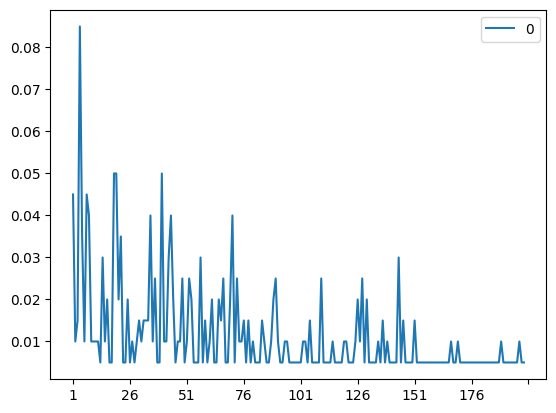

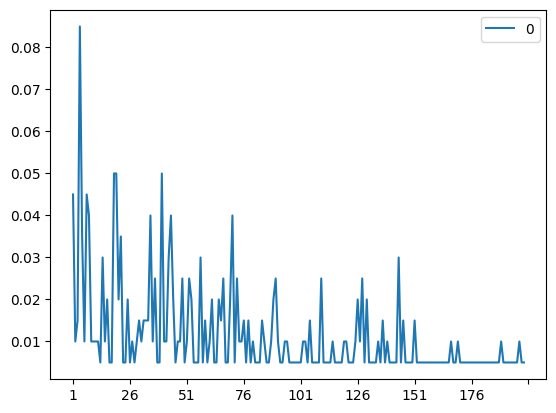

In [ ]:
p.plot()

# startnig new phase 0

In [268]:
def create_network1O1(nodes=101,k=2,seed=seed,p=0.2,types=0):
    # np.random.seed(0)
    np.random.seed(seed)
    # np.random.rand(seed)


    if types == 1:
        G1 = nx.barabasi_albert_graph(nodes,m=k,seed=seed)
    elif types == 0:
        G1 = nx.watts_strogatz_graph(nodes,k,p=p,seed=seed)
    if k > 3:
        edges = G1.edges()
        # print('edges' , len(edges))
        m = np.array(edges)
        h = int(len(m[m[:,0]==0])/2)
        # print('h',h)
        # print(m[m[:,0]==0])
        nds = G1.nodes()
        po = np.random.randint(h*2,len(edges),int(nodes*3.2))
        # print('po',po)
        eds = list(np.array(edges)[po])
        eds2 = list(np.array(edges)[0:h])
        eds = eds + eds2
        eds = np.array(eds)
        # print('eds',eds)
        G=nx.empty_graph()
        G.add_nodes_from(nds)
        G.add_edges_from(np.array(eds))
        # print(len(G.edges()))
    else:
        G = G1
        # edges= G.edges()

    components_of_groph = sorted(nx.connected_components(G), key=len, reverse=True)
    while len(components_of_groph) != 1:
        multiple = len(components_of_groph)
        # print(f'model has {multiple} clusters so we connected them.')
        # drows2(G)
        # if len(components_of_groph)==2:
        g1 = list(components_of_groph[0])
        g2 = list(components_of_groph[1])
        if len(g2) < 3:
            k1 = 1
        else:
            k1 = k
        grand1 = np.random.randint(0,len(g1),k1)
        grand2 = np.random.randint(0,len(g2),k1)
        # print(grand1,grand2)
        for i,j in zip(grand1,grand2):
            print(g1[i],g2[j])
            G.add_edge(g1[i],g2[j])
        # else:pass
        components_of_groph = sorted(nx.connected_components(G), key=len, reverse=True)
    # drows2(G)


    Nett = pn.case118()

    #create empty net
    net = pp.create_empty_network()

    l =(nodes/Nett['bus'].shape[0]) # relation between our network on 118 network
    #create buses and bus elements
    sigma,mu  = Nett['bus']['vn_kv'].std(),Nett['bus']['vn_kv'].mean()
    # sigma,mu = sigma*l,mu*l
    sigma,mu = sigma*l,mu

    s0 = np.abs(np.random.normal(mu, sigma, nodes))

    sigma,mu  = Nett['load']['p_mw'].std(),Nett['load']['p_mw'].mean()
    # sigma,mu = sigma*l,mu*l
    sigma,mu = sigma*l,mu

    s1 = np.abs(np.random.normal(mu, sigma, nodes))

    # sigma,mu  = Nett['load']['q_mvar'].std(),Nett['load']['q_mvar'].mean()
    # sigma,mu = sigma*l,mu*l
    # sigma,mu = sigma*l,mu
    sigma,mu = 0.2,0.5
    s2 = np.abs(np.random.normal(mu, sigma, nodes))
    s2[s2>0.8] = 0.8
    # s2[s2<0.1] = 0.8

    sigma,mu  = Nett['gen']['p_mw'].std(),Nett['gen']['p_mw'].mean()
    # sigma,mu = sigma*l,mu*l
    sigma,mu = sigma*l,mu

    s3 = np.abs(np.random.normal(mu, sigma,int(30*l)))

    sigma,mu = 0.03,0.97
    s4 = np.abs(np.random.normal(mu, sigma, int(30*l)))

    for i in range(nodes):
        pp.create_bus(net, vn_kv=s0[i], name=f"Bus {i}")
        # if i not in jj:
            # pp.create_load(net, bus=i, p_mw=s1[i], q_mvar=s2[i], name=f"Load {i}")

    pp.create_ext_grid(net, bus=0, vm_pu=1.02, name="Grid Connection")

    jj = set()

    for i in range(int(30*l)):
        j = np.random.randint(nodes)
        if j not in jj and j!=0:
            pp.create_gen(net=net, bus=j, p_mw=s3[i], vm_pu=s4[i],name=f"gen {i}",max_p_mw=1.5*s3[i] ,min_p_mw=0,min_q_mvar=-20*l,max_q_mvar=20*l)
        jj.add(j)
    s4 = np.abs(np.random.normal(mu, sigma, nodes))
    for i in range(1,nodes):
        if i not in jj:
            pp.create_load(net, bus=i, p_mw=s1[i], q_mvar=s2[i]*s1[i], name=f"Load {i}",vm_pu=s4[i])

    edges = list(G.edges())
    for i,j in edges:
        # print(i,j)
        pp.create_line(net, from_bus=i, to_bus=j, length_km=1, name=f"Line {i}-{j}",std_type="NAYY 4x50 SE",)

    net['line']['max_i_ka'] = 7 * l

    pp.rundcpp(net=net)
    m = np.array(net['res_line'][net['res_line']['loading_percent']>80].index)
    # print(net['line']['max_i_ka'][m])
    # net['line']['max_i_ka'][m] *= (net['res_line']['loading_percent'][m]*1.25)/100
    net['line']['max_i_ka'][m] *= (net['res_line']['loading_percent'][m]*2)/100
    pp.rundcpp(net=net)
    # print(net['line']['max_i_ka'][m])
    G_power = top.create_nxgraph(net=net)
    posP = nx.spring_layout(G_power, seed = seed)
    kl = pd.DataFrame().from_dict(posP,orient='index')
    net['bus_geodata']['x'] = kl[0]
    net['bus_geodata']['y'] = kl[1]
    net['bus_geodata']['coords'] = None



    return net

In [269]:
nodes = 20
net3 = create_network1O1(nodes=nodes,k=4,p=0.25)
net_base = pp.pandapowerNet(net3)
# net3 = pn.case30()
# net_base = pp.pandapowerNet(net3)
# nodes = 300
pp.rundcpp(net_base)
pf_res_plotly(net_base)

/usr/local/lib/python3.10/dist-packages/pandapower/plotting/plotly/pf_res_plotly.py:164: FutureWarning:

The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.



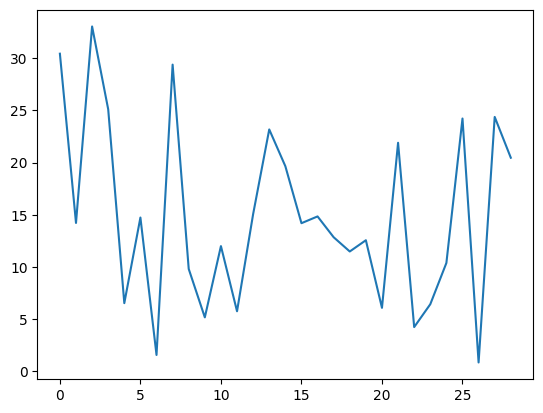

In [270]:
plt.plot(net_base['res_line']['loading_percent'])

In [199]:
# net_base['res_line']['loading_percent']

In [200]:
# net = pp.pandapowerNet(net3)

In [201]:
# net

In [202]:
# pp.drop_lines(Net,drop_lines)
# pp.rundcpp(net)
# drop_lines = pp.overloaded_lines(Net)
# pp.drop_buses(Net,set_nodes_2,drop_elements = True)

In [203]:
# list(net_base['gen'].bus)

In [204]:
# net['gen']['p_mw'].iloc[0] = 100

In [205]:
# net['gen']['p_mw']

In [206]:
# p = list(net_base['gen'].bus.index)
# p.remove(0)

In [208]:
# net['gen']['slack']

In [209]:
# net['gen']

In [174]:
# net = pp.pandapowerNet(net3)
# i = 1
# net['gen']['slack'].iloc[i] = True
# net['gen']['max_p_mw'].iloc[i] = 5
# pp.rundcpp(net)
# net['res_gen']


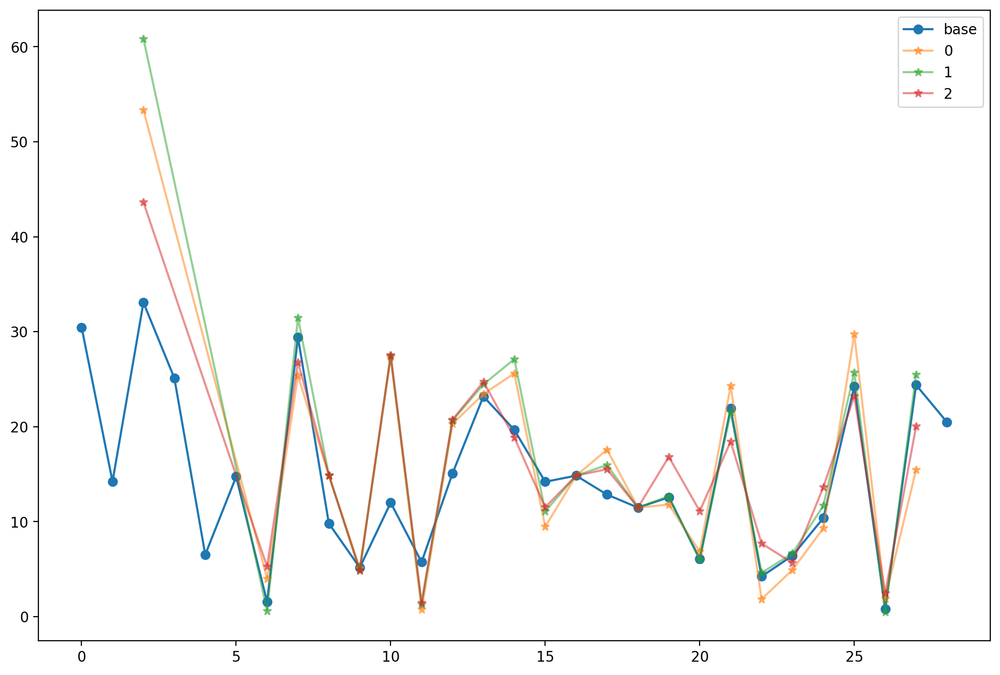

In [312]:
plt.figure(figsize=(12,8),dpi=200)
pp.rundcpp(net_base)
plt.plot(net_base['res_line']['loading_percent'],label='base',marker='o')
for j in net['gen'].index[0:-2]:
    # try:
        # i = 0
        net = pp.pandapowerNet(net3)
        net['gen']['p_mw'].iloc[j] *=1.8
        net['gen']['p_mw'].iloc[j+1] *=1.5
        net['gen']['p_mw'].iloc[j+2] *=1.5

        pp.drop_buses(net,[1,19],drop_elements = True)
        # net['gen']['p_mw'].iloc[1] *=1.5
        # net['gen']['slack'].iloc[j] = True
        # print(j)
        pp.rundcpp(net)
        plt.plot(net['res_line']['loading_percent'],label=f'{j}',alpha=0.5,marker='*')
    # except:pass
plt.legend()
plt.show()

In [313]:
net['gen']

,name,bus,p_mw,vm_pu,sn_mva,min_q_mvar,max_q_mvar,scaling,slack,in_service,slack_weight,type,min_p_mw,max_p_mw
0,gen 0,17,66.954174,0.959433,NaN,-3.389831,3.389831,1.0,False,True,0.0,None,0.0,100.431261
2,gen 2,6,164.324157,0.996555,NaN,-3.389831,3.389831,1.0,False,True,0.0,None,0.0,136.936798
3,gen 3,2,87.030178,0.974396,NaN,-3.389831,3.389831,1.0,False,True,0.0,None,0.0,87.030178
4,gen 4,11,87.010454,0.963011,NaN,-3.389831,3.389831,1.0,False,True,0.0,None,0.0,87.010454


In [314]:
net_base['res_gen']

,p_mw,q_mvar,va_degree,vm_pu
0,66.954174,NaN,-0.035161,0.959433
1,69.020951,NaN,-0.009068,0.991263
2,91.291199,NaN,-0.033502,0.996555
3,58.020118,NaN,-0.022184,0.974396
4,58.006969,NaN,-0.039202,0.963011


In [297]:
pf_res_plotly(net)

/usr/local/lib/python3.10/dist-packages/pandapower/plotting/plotly/pf_res_plotly.py:164: FutureWarning:

The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.



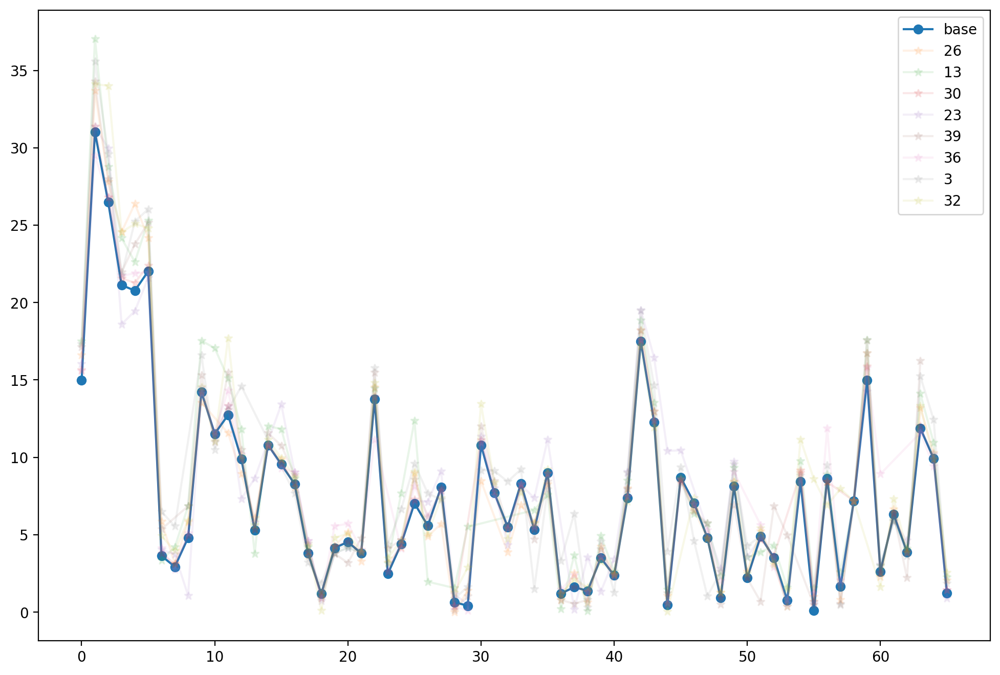

In [195]:
plt.figure(figsize=(12,8),dpi=200)
pp.rundcpp(net_base)
plt.plot(net_base['res_line']['loading_percent'],label='base',marker='o')
for i,j in zip(list(net_base['gen'].bus.index),list(net_base['gen'].bus)):
    net = pp.pandapowerNet(net3)
    # net['gen']['p_mw'].iloc[i] *=2
    pp.drop_buses(net,[j],drop_elements = True)
    # net['gen']['p_mw'].iloc[1] *=1.5
    # net['gen']['slack'].iloc[1] = True
    # print(i,j)
    pp.rundcpp(net)
    plt.plot(net['res_line']['loading_percent'],label=f'{j}',alpha=0.1,marker='*')
plt.legend()
plt.show()

In [163]:
pf_res_plotly(net)

/usr/local/lib/python3.10/dist-packages/pandapower/plotting/plotly/pf_res_plotly.py:164: FutureWarning:

The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.



In [92]:
pf_res_plotly(net_base)

/usr/local/lib/python3.10/dist-packages/pandapower/plotting/plotly/pf_res_plotly.py:164: FutureWarning:

The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.



In [162]:
net['res_line']

,p_from_mw,q_from_mvar,p_to_mw,q_to_mvar,pl_mw,ql_mvar,i_from_ka,i_to_ka,i_ka,vm_from_pu,va_from_degree,vm_to_pu,va_to_degree,loading_percent
0,51.447120,0.0,-51.447120,0.0,0.0,0.0,0.185115,0.150865,0.185115,1.020000,0.000000,1.000155,-0.009887,10.401684
1,117.359279,0.0,-117.359279,0.0,0.0,0.0,0.422277,0.418863,0.422277,1.020000,0.000000,1.000000,-0.022553,23.727940
2,51.880981,0.0,-51.880981,0.0,0.0,0.0,0.186676,0.183853,0.186676,1.020000,0.000000,0.987550,-0.009970,10.489403
3,64.041387,0.0,-64.041387,0.0,0.0,0.0,0.230431,0.242951,0.242951,1.020000,0.000000,1.000000,-0.012307,13.651554
4,54.082021,0.0,-54.082021,0.0,0.0,0.0,0.194596,0.167735,0.194596,1.020000,0.000000,1.000000,-0.010393,10.934414
5,124.684873,0.0,-124.684873,0.0,0.0,0.0,0.448636,0.424630,0.448636,1.020000,0.000000,1.000000,-0.023961,25.209044
6,-9.321258,0.0,9.321258,0.0,0.0,0.0,0.035362,0.028910,0.035362,1.000000,-0.012307,1.000000,-0.010393,1.986991
7,40.243287,0.0,-40.243287,0.0,0.0,0.0,0.152669,0.133545,0.152669,1.000000,-0.012307,1.000000,-0.020570,8.578568
8,56.757985,0.0,-56.757985,0.0,0.0,0.0,0.215321,0.193297,0.215321,1.000000,-0.012307,1.000000,-0.023961,12.098968
9,-60.199779,0.0,60.199779,0.0,0.0,0.0,0.228378,0.210154,0.228378,1.000000,-0.012307,0.992476,0.000054,12.832648


In [ ]:
simple_plot, pf_res_plotly,simple_plotly

In [51]:
set_nodes_2 = [3]
pp.drop_buses(net,set_nodes_2,drop_elements = True)

In [52]:
net

This pandapower network includes the following parameter tables:
   - bus (29 element)
   - load (21 element)
   - gen (7 element)
   - ext_grid (1 elements)
   - line (45 element)
   - bus_geodata (29 element)
 and the following results tables:
   - res_bus (29 element)
   - res_line (45 element)
   - res_ext_grid (1 elements)
   - res_load (21 element)
   - res_gen (7 element)

# resume 8

# resume 8-2

# resume 9

# resume 10

# resume 11

# resume 12